In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
df = pd.read_csv('Groceries data.csv')

In [ ]:
df.head()

,Member_number,Date,itemDescription,year,month,day,day_of_week
0,1808,2015-07-21,tropical fruit,2015,7,21,1
1,2552,2015-05-01,whole milk,2015,5,1,4
2,2300,2015-09-19,pip fruit,2015,9,19,5
3,1187,2015-12-12,other vegetables,2015,12,12,5
4,3037,2015-01-02,whole milk,2015,1,2,4


Sales per month you can see the sales corresponding to the month number

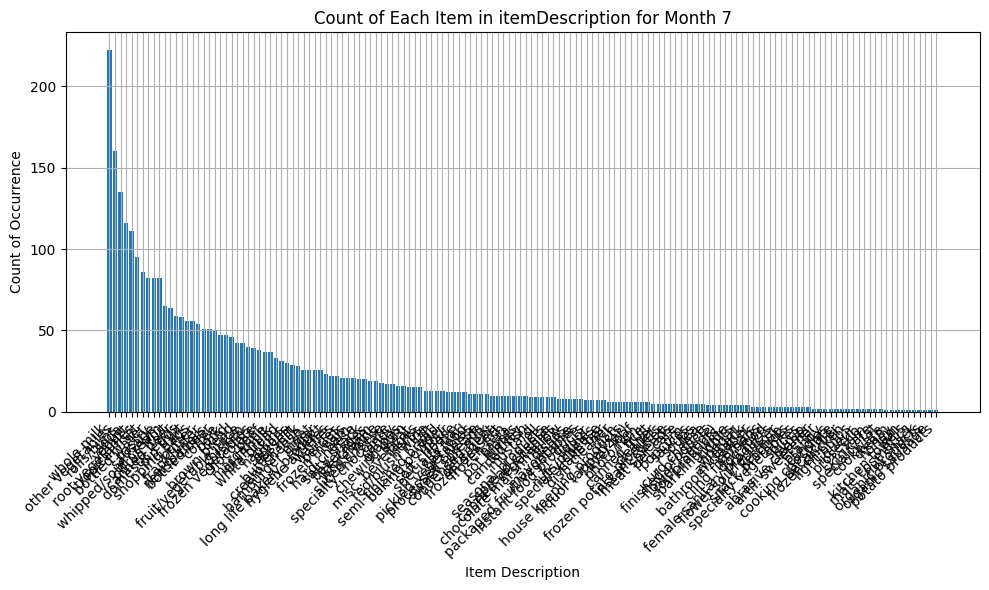

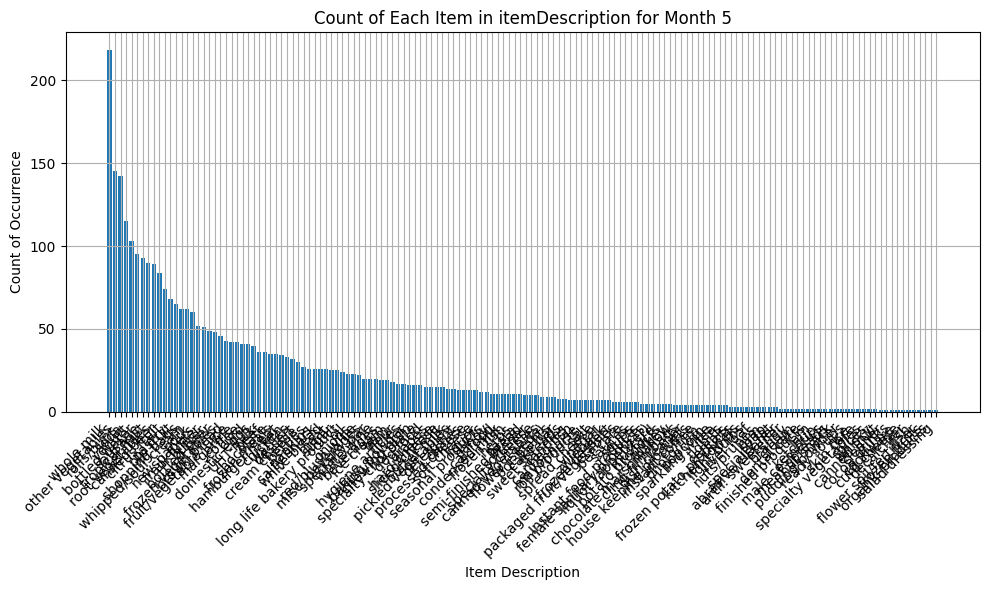

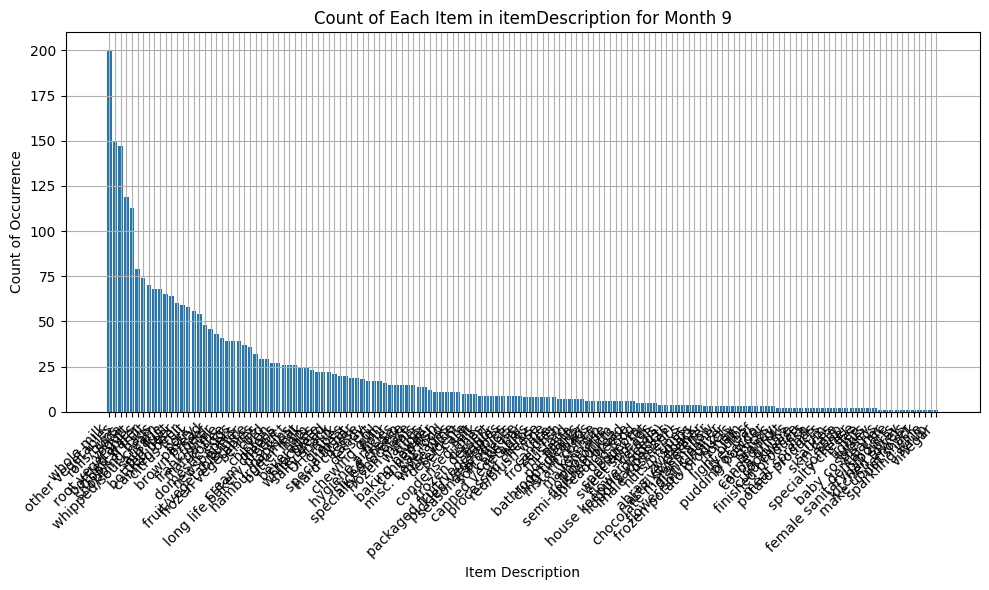

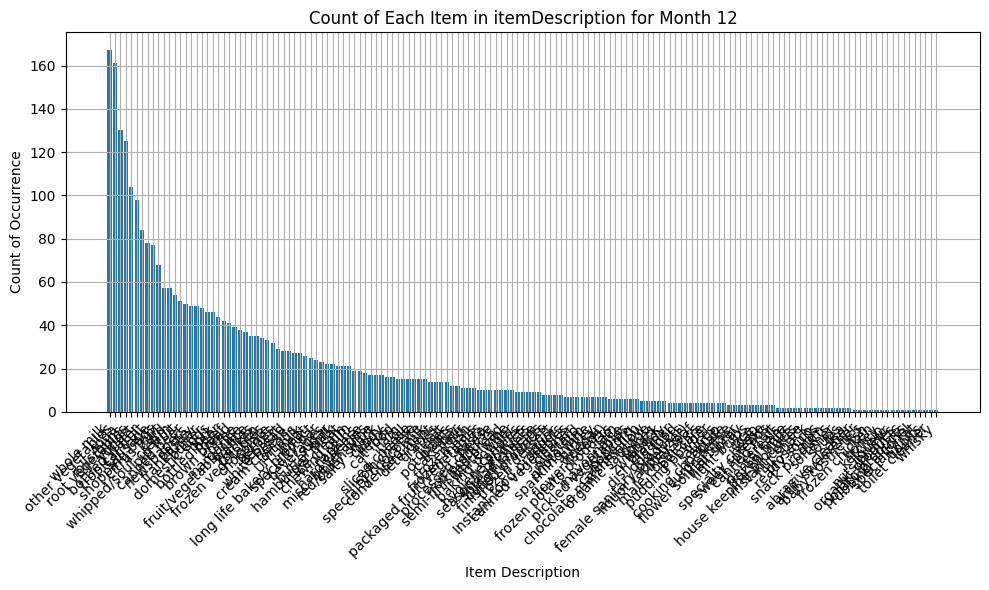

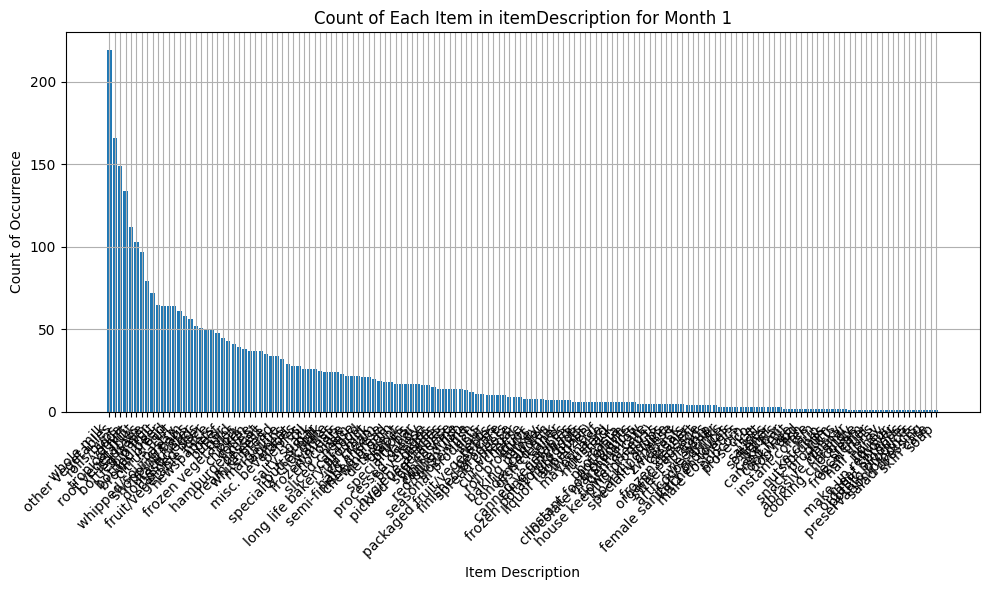

...

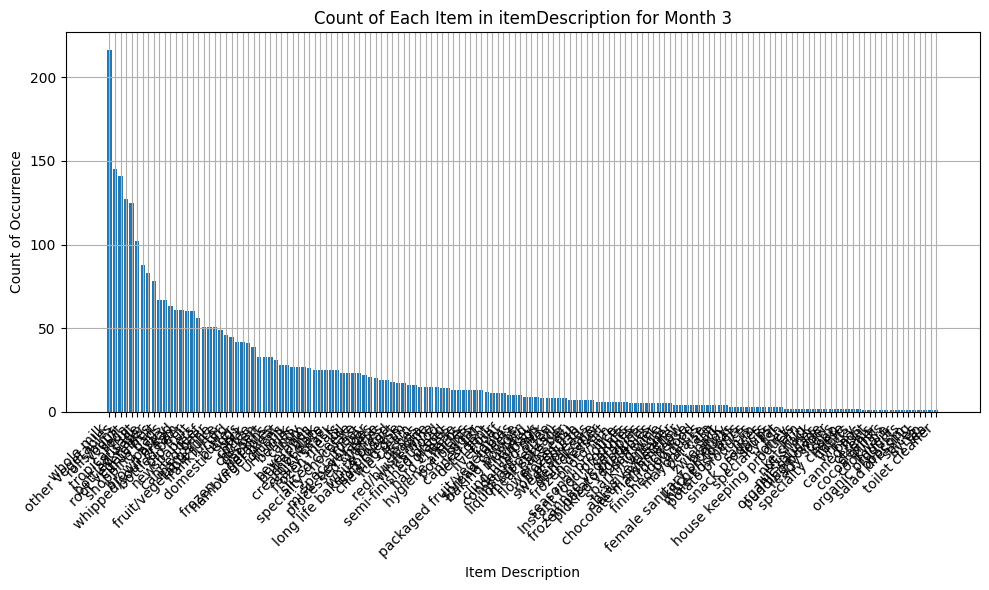

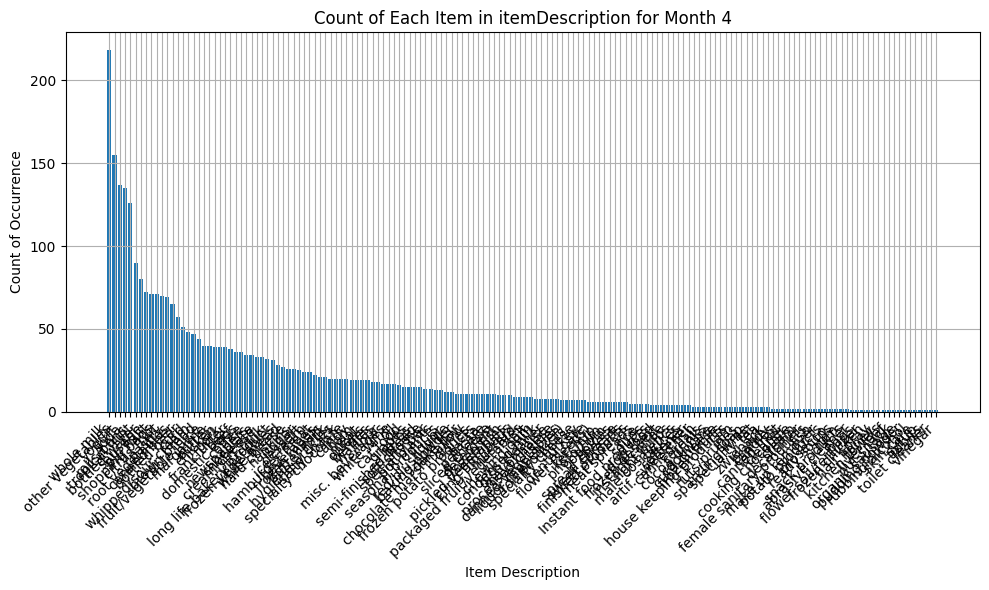

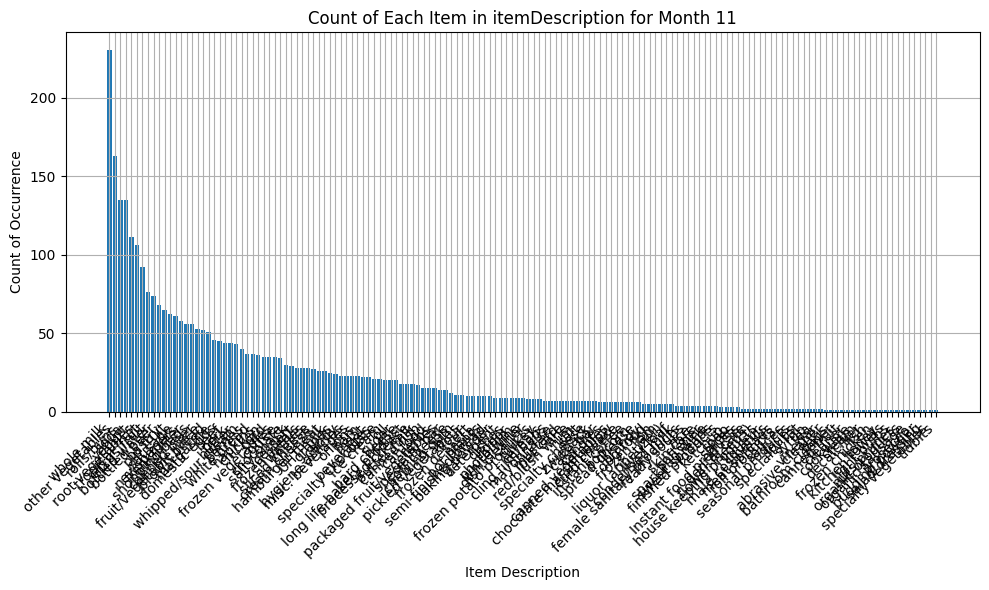

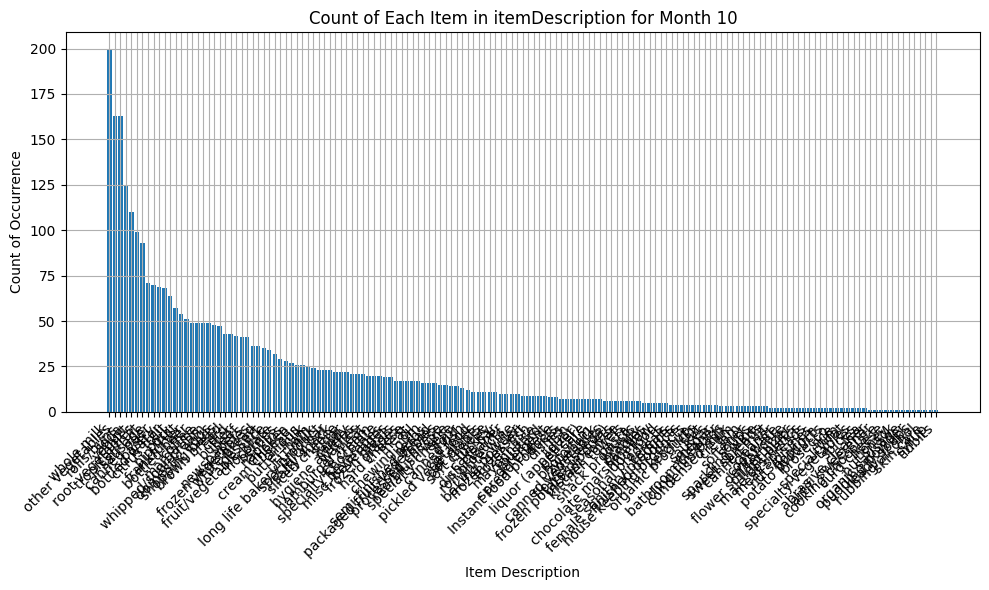

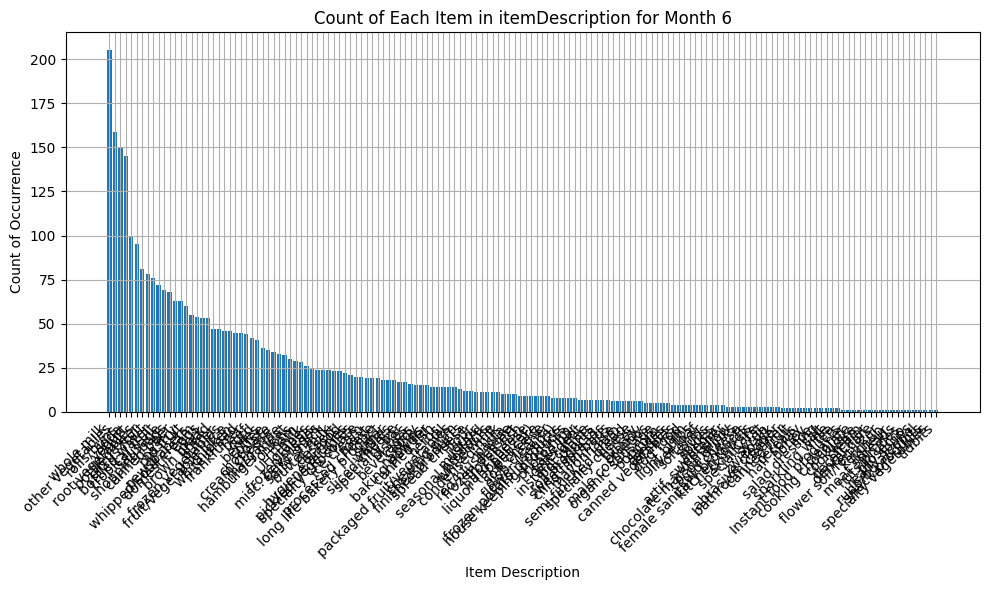

In [ ]:
item_counts_by_month = df.groupby(['month', 'itemDescription']).size().reset_index(name='Count')
item_counts_by_month = item_counts_by_month.sort_values(by=['month', 'Count'], ascending=[True, False])
months = df['month'].unique()

for month in months:
    plt.figure(figsize=(10, 6))
    data = item_counts_by_month[item_counts_by_month['month'] == month]
    plt.bar(data['itemDescription'], data['Count'])
    plt.xlabel('Item Description')
    plt.ylabel('Count of Occurrence')
    plt.title(f'Count of Each Item in itemDescription for Month {month}')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


To make it clearer lets only look at top 40 items

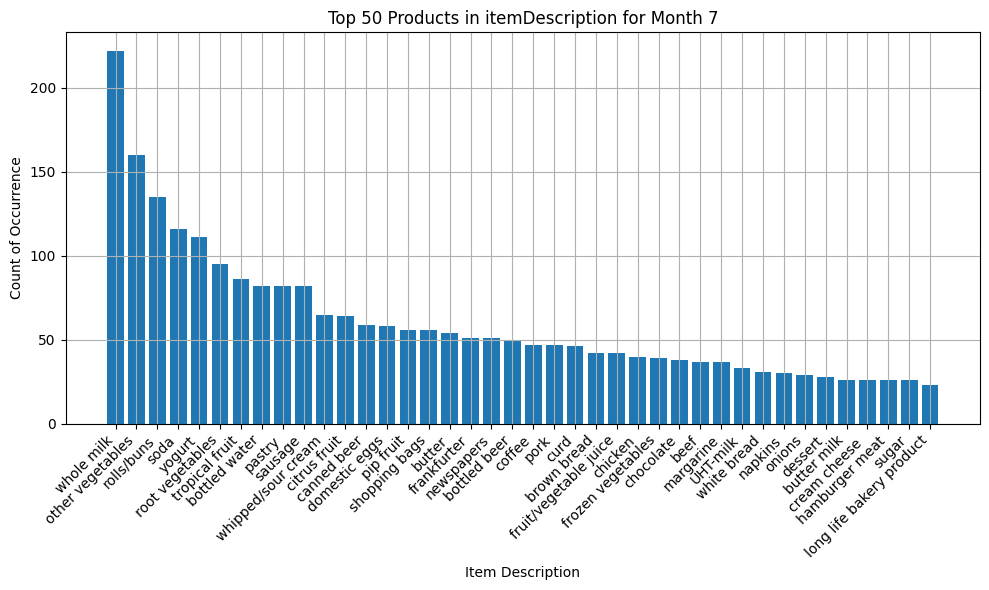

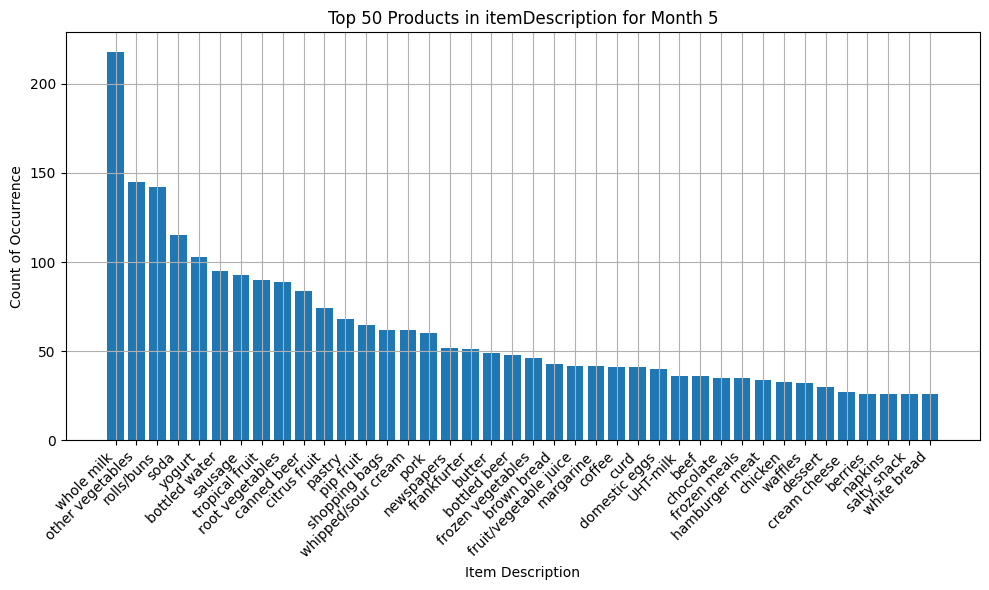

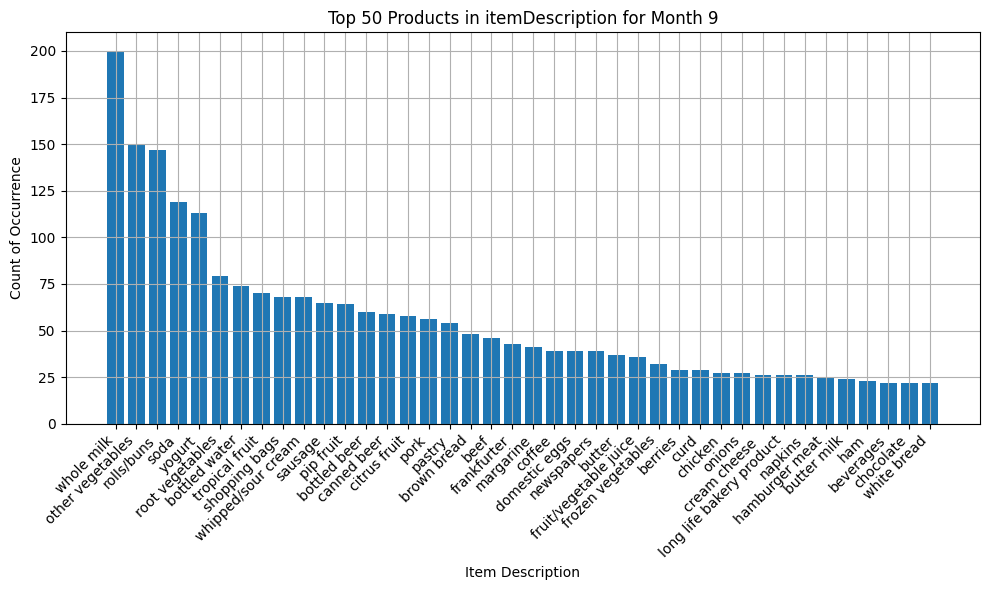

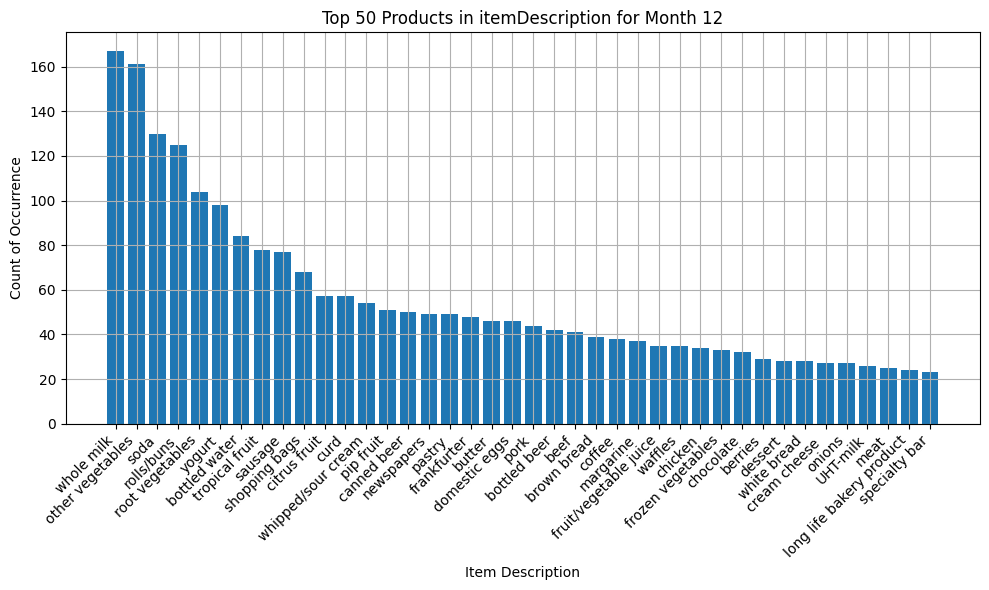

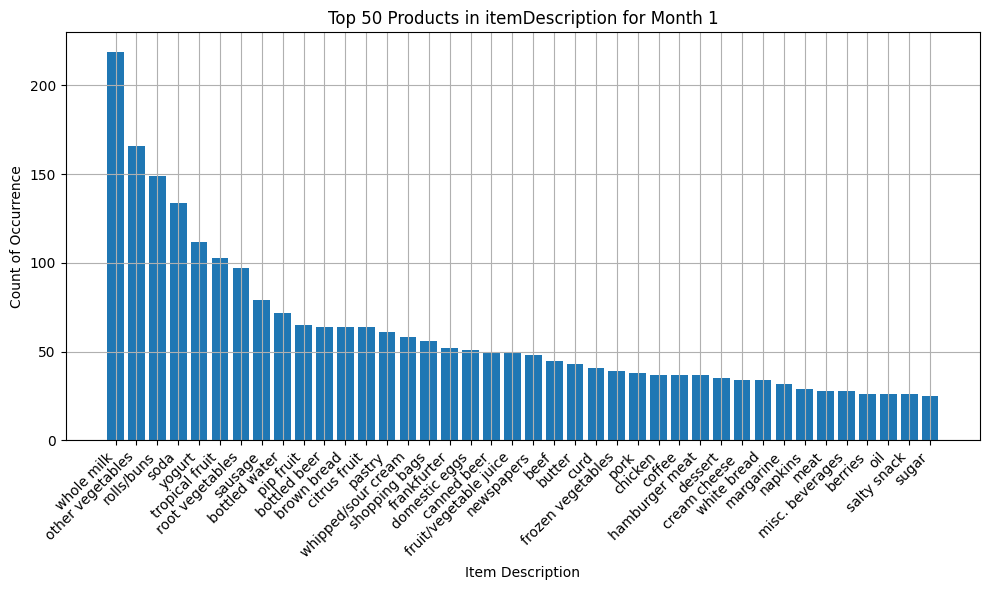

...

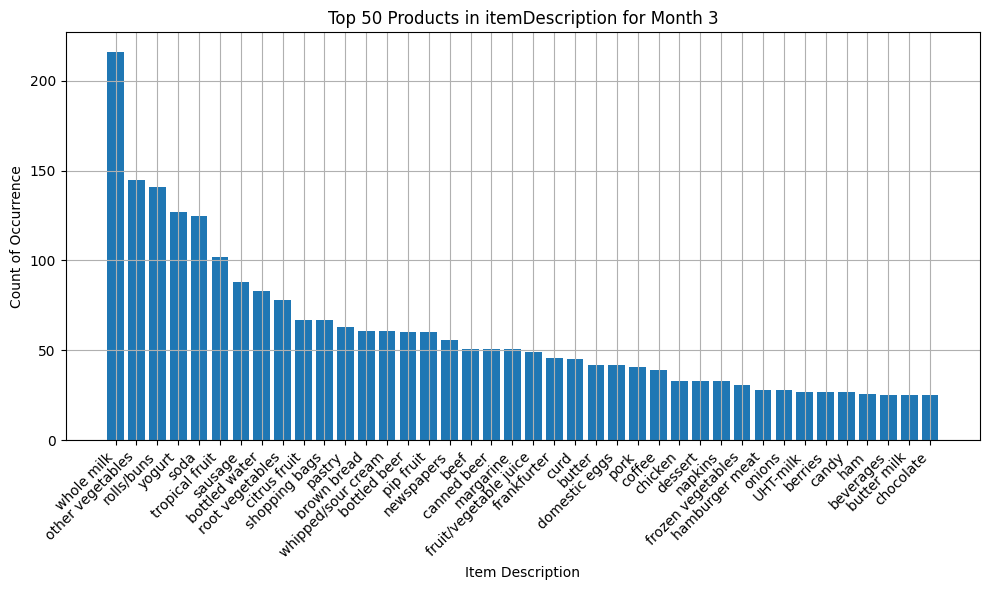

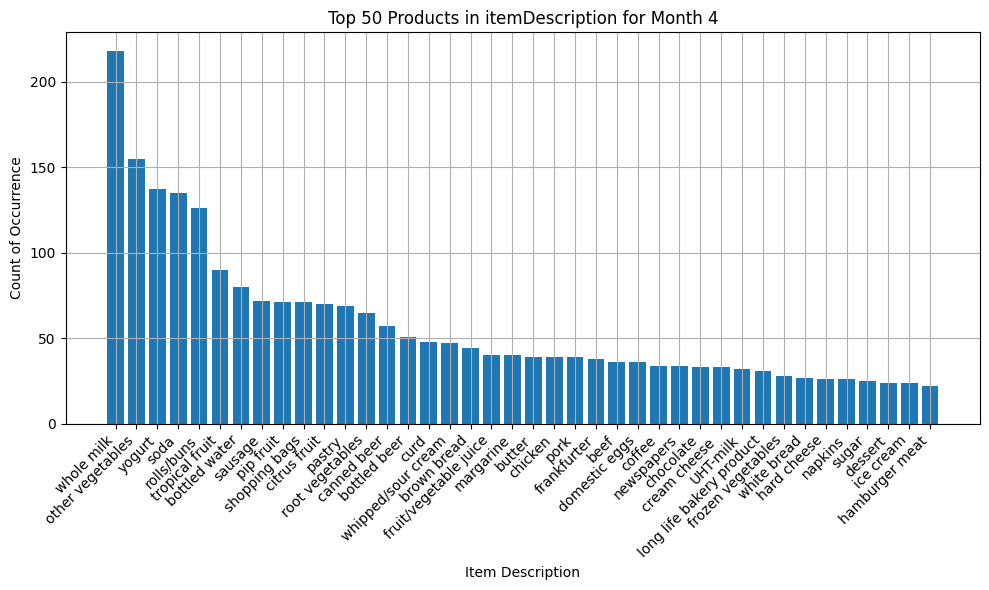

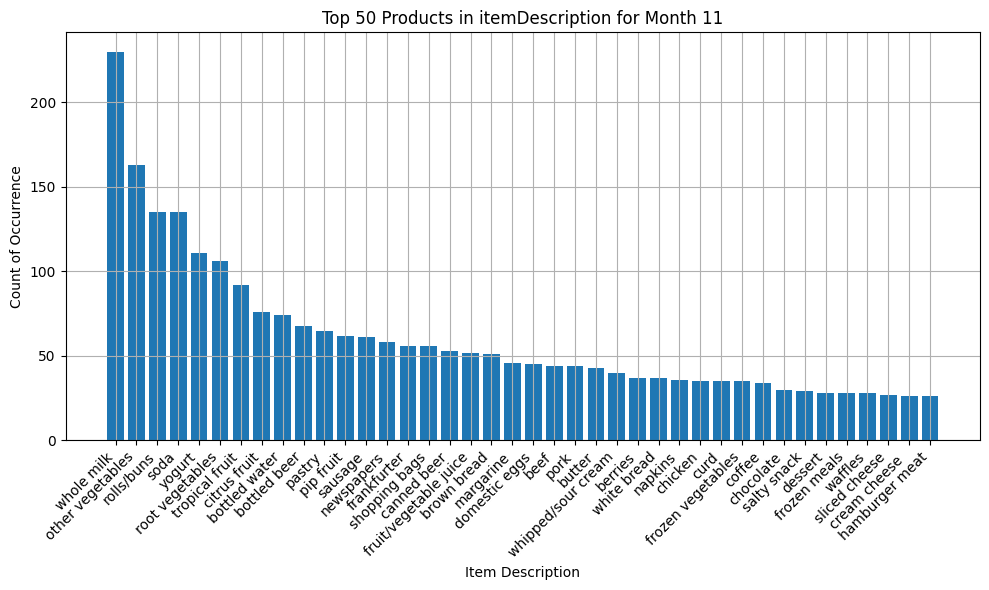

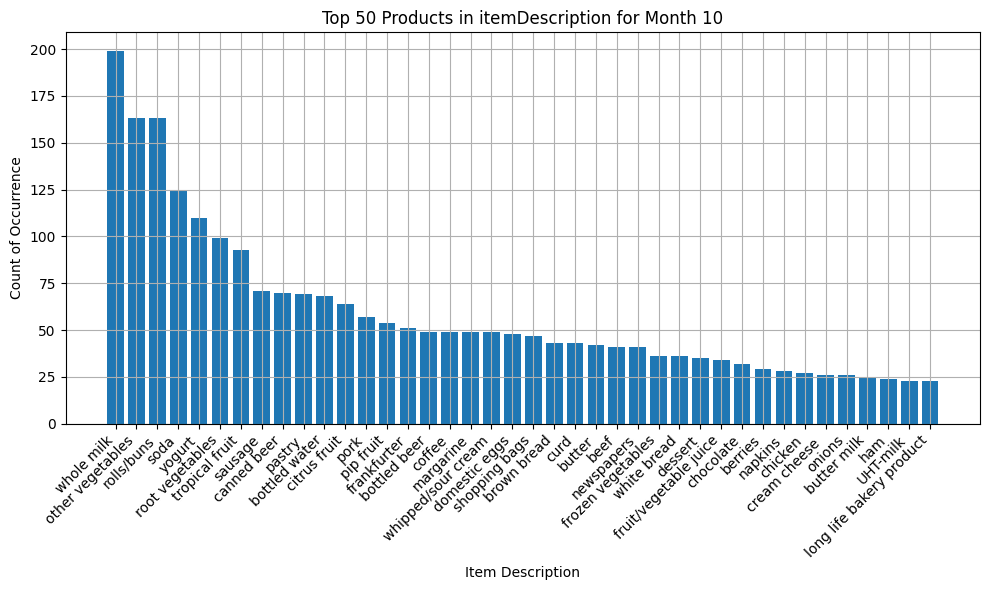

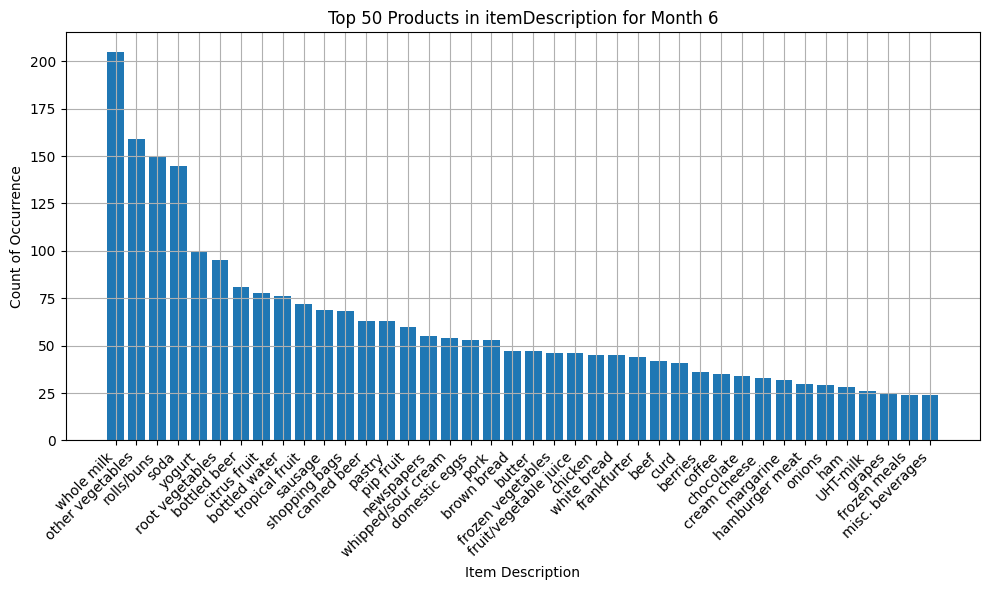

In [ ]:
top_50_products_by_month = item_counts_by_month.groupby('month').head(40)
months = df['month'].unique()

for month in months:
    plt.figure(figsize=(10, 6))
    data = top_50_products_by_month[top_50_products_by_month['month'] == month]
    plt.bar(data['itemDescription'], data['Count'])
    plt.xlabel('Item Description')
    plt.ylabel('Count of Occurrence')
    plt.title(f'Top 50 Products in itemDescription for Month {month}')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

Now lets make a table with the sales of each month corressponding to an item

In [ ]:
item_counts_by_month = df.groupby(['month', 'itemDescription']).size().reset_index(name='Count')
table = item_counts_by_month.pivot(index='itemDescription', columns='month', values='Count').fillna(0)

In [ ]:
table.head()

month,1,2,3,4,5,6,7,8,9,10,11,12
itemDescription,,,,,,,,,,,,
Instant food products,5.0,11.0,5.0,4.0,5.0,1.0,7.0,6.0,0.0,7.0,2.0,7.0
UHT-milk,20.0,22.0,27.0,32.0,36.0,26.0,33.0,33.0,20.0,23.0,25.0,26.0
abrasive cleaner,1.0,2.0,4.0,1.0,2.0,2.0,2.0,2.0,3.0,1.0,1.0,1.0
artif. sweetener,3.0,4.0,4.0,3.0,2.0,3.0,2.0,3.0,3.0,1.0,0.0,1.0
baby cosmetics,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


Now lets make a heat map for visualisation
(look at the colour range on right)

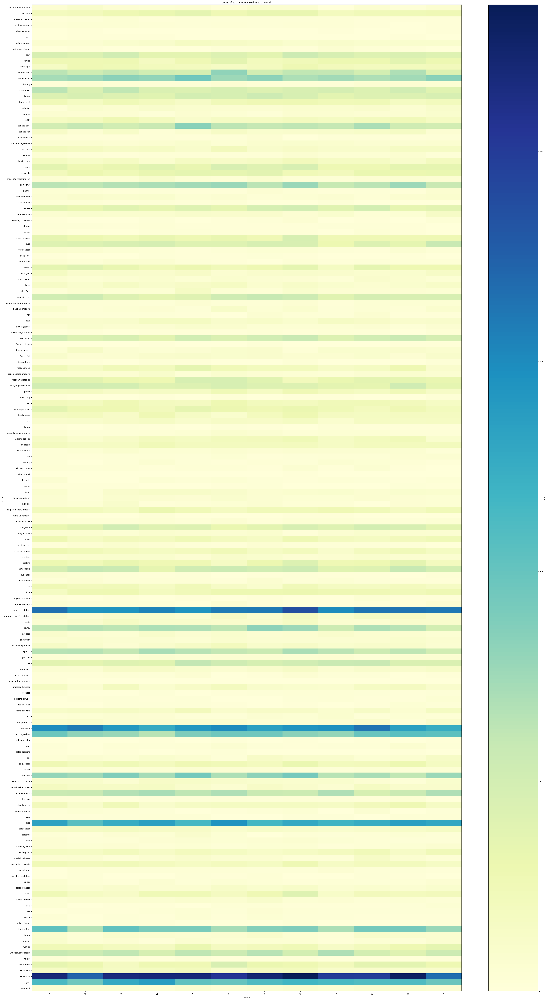

In [ ]:
plt.figure(figsize=(40, 70))
plt.imshow(table, cmap='YlGnBu', aspect='auto')
plt.colorbar(label='Count')
plt.xlabel('Month')
plt.ylabel('Product')
plt.title('Count of Each Product Sold in Each Month')
plt.xticks(range(len(df['month'].unique())), df['month'].unique(), rotation=45)
plt.yticks(range(len(table.index)), table.index)
plt.tight_layout()
plt.show()

Now lets sort this on the basis of top selling products

In [ ]:
table['Total'] = table.sum(axis=1)

table_sorted = table.sort_values(by='Total', ascending=False)
table_sorted = table_sorted.head(40)
table_sorted.head()

month,1,2,3,4,5,6,7,8,9,10,11,12,Total
itemDescription,,,,,,,,,,,,,
whole milk,219.0,173.0,216.0,218.0,218.0,205.0,222.0,235.0,200.0,199.0,230.0,167.0,7506.0
other vegetables,166.0,144.0,145.0,155.0,145.0,159.0,160.0,187.0,150.0,163.0,163.0,161.0,5694.0
rolls/buns,149.0,159.0,141.0,126.0,142.0,150.0,135.0,144.0,147.0,163.0,135.0,125.0,5148.0
soda,134.0,107.0,125.0,135.0,115.0,145.0,116.0,128.0,119.0,125.0,135.0,130.0,4542.0
yogurt,112.0,95.0,127.0,137.0,103.0,100.0,111.0,117.0,113.0,110.0,111.0,98.0,4002.0


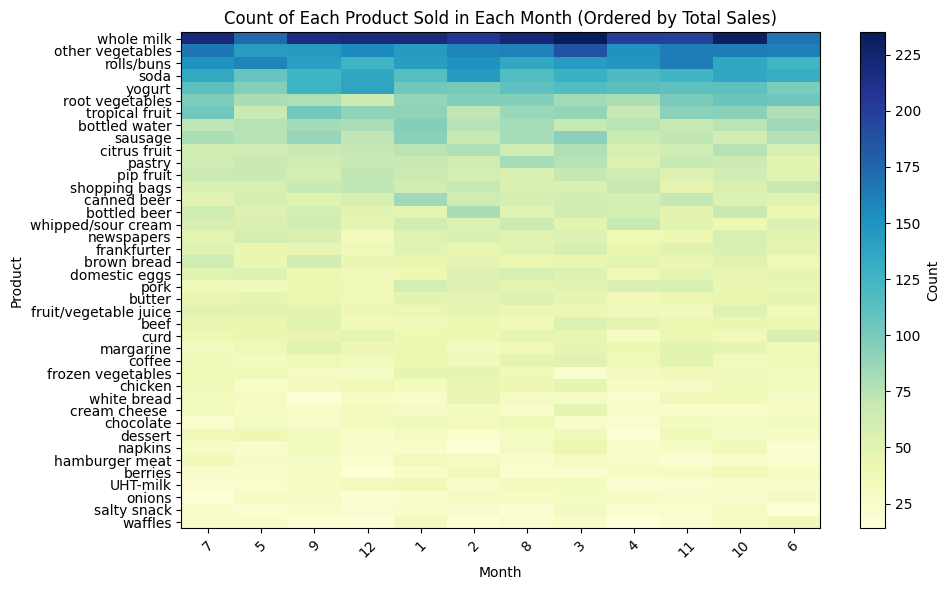

In [ ]:
plt.figure(figsize=(10, 6))
plt.imshow(table_sorted.drop('Total', axis=1), cmap='YlGnBu', aspect='auto')
plt.colorbar(label='Count')
plt.xlabel('Month')
plt.ylabel('Product')
plt.title('Count of Each Product Sold in Each Month (Ordered by Total Sales)')
plt.xticks(range(len(df['month'].unique())), df['month'].unique(), rotation=45)
plt.yticks(range(len(table_sorted.index)), table_sorted.index)
plt.tight_layout()
plt.show()

In [ ]:
unique_items = df['itemDescription'].unique()

# Print the unique items
print(unique_items)


['tropical fruit' 'whole milk' 'pip fruit' 'other vegetables' 'rolls/buns'
 'pot plants' 'citrus fruit' 'beef' 'frankfurter' 'chicken' 'butter'
 'fruit/vegetable juice' 'packaged fruit/vegetables' 'chocolate'
 'specialty bar' 'butter milk' 'bottled water' 'yogurt' 'sausage'
 'brown bread' 'hamburger meat' 'root vegetables' 'pork' 'pastry'
 'canned beer' 'berries' 'coffee' 'misc. beverages' 'ham' 'turkey'
 'curd cheese' 'red/blush wine' 'frozen potato products' 'flour' 'sugar'
 'frozen meals' 'herbs' 'soda' 'detergent' 'grapes' 'processed cheese'
 'fish' 'sparkling wine' 'newspapers' 'curd' 'pasta' 'popcorn'
 'finished products' 'beverages' 'bottled beer' 'dessert' 'dog food'
 'specialty chocolate' 'condensed milk' 'cleaner' 'white wine' 'meat'
 'ice cream' 'hard cheese' 'cream cheese ' 'liquor' 'pickled vegetables'
 'liquor (appetizer)' 'UHT-milk' 'candy' 'onions' 'hair spray'
 'photo/film' 'domestic eggs' 'margarine' 'shopping bags' 'salt' 'oil'
 'whipped/sour cream' 'frozen vegetable

In [ ]:
item_counts = df['itemDescription'].value_counts()

In [ ]:
# Get the count of unique elements in the 'itemDescription' column
unique_items_count = df['itemDescription'].nunique()

# Print the count of unique elements
print(unique_items_count)

167


In [ ]:
print(item_counts)

whole milk               2502
other vegetables         1898
rolls/buns               1716
soda                     1514
yogurt                   1334
                         ... 
rubbing alcohol             5
bags                        4
baby cosmetics              3
kitchen utensil             1
preservation products       1
Name: itemDescription, Length: 167, dtype: int64


In [ ]:
categories = {
    'Fresh Produce': ['tropical fruit', 'pip fruit', 'other vegetables', 'citrus fruit', 'pot plants', 'root vegetables',
                      'berries', 'grapes', 'onions', 'specialty vegetables'],
    'Dairy Products': ['whole milk', 'butter', 'butter milk', 'yogurt', 'curd cheese', 'cream cheese ', 'hard cheese',
                       'sliced cheese', 'specialty cheese', 'UHT-milk', 'curd', 'spread cheese', 'soft cheese'],
    'Meat and Poultry': ['beef', 'organic sausage', 'chicken', 'frankfurter', 'sausage', 'ham', 'turkey', 'pork', 'hamburger meat', 'domestic eggs', 'fish', 'meat', 'liver loaf'],
    'Liquor': ['whisky', 'prosecco', 'liqueur', 'bottled beer', 'red/blush wine', 'white wine', 'liquor', 'sparkling wine', 'liquor (appetizer)', 'rubbing alcohol',
               'brandy', 'rum'],
    'Beverages': ['beverages', 'fruit/vegetable juice', 'bottled water', 'soda', 'coffee', 'cocoa drinks', 'misc. beverages'],
    'Snacks and Sweets': ['chocolate', 'snack products', 'specialty bar', 'candy', 'specialty chocolate', 'chocolate marshmallow',
                          'sweet spreads', 'waffles', 'sweeteners', 'chewing gum', 'specialty fat', 'candy', 'nut snack', 'nuts/prunes', 'salty snack'],
    'Bakery and Bread': ['rolls/buns', 'brown bread', 'long life bakery product', 'zwieback', 'honey', 'jam','cake bar', 'pastry', 'white bread', 'semi-finished bread'],
    'Frozen and Convenience Foods': ['frozen potato products', 'frozen meals', 'frozen vegetables', 'frozen chicken',
                                     'frozen fish', 'frozen fruits', 'instant food products'],
    'Canned and Packaged Foods': ['packaged fruit/vegetables', 'canned beer', 'canned fruit', 'canned vegetables',
                                  'canned fish', 'salt', 'oil', 'whipped/sour cream', 'vinegar', 'syrup', 'cream', 'cooking chocolate',
                                  'flower (seeds)', 'rice', 'tea', 'meat spreads', 'artif. sweetener', 'canned vegetables', 'baking powder',
                                  'margarine', 'frozen dessert', 'potato products', 'tidbits','flour', 'sugar', 'processed cheese',
                                  'pasta', 'popcorn','dessert', 'condensed milk', 'ice cream', 'pickled vegetables'
                                  , 'soups', 'instant coffee', 'cereals', 'mayonnaise', 'ready soups'],
    'Condiments and Spices': ['herbs', 'spices', 'mustard', 'sauces', 'salad dressing', 'pudding powder', 'ketchup'],
    'Household Essentials': ['detergent', 'cleaner', 'decalcifier', 'shopping bags', 'cling film/bags',
                             'napkins', 'kitchen towels', 'candles', 'light bulbs',
                             'flower soil/fertilizer', 'dish cleaner', 'cleaner', 'abrasive cleaner', 'seasonal products',
                             'organic products', 'candles', 'kitchen utensil', 'softener', 'dishes', 'preservation products', 'roll products ',
                             'house keeping products' , 'cookware', 'bathroom cleaner', 'bags', 'toilet cleaner'],
    'Personal Care and Hygiene': ['hair spray', 'soap', 'female sanitary products', 'dental care',
                                  'skin care', 'rubbing alcohol', 'hygiene articles', 'make up remover', 'skin care', 'male cosmetics', 'baby cosmetics'],
    'Pet Care': ['dog food', 'cat food', 'pet care'],
    'Other': ['newspapers', 'photo/film']
}


In [ ]:
categories = {
    'Fresh Produce': ['tropical fruit', 'pip fruit', 'other vegetables', 'citrus fruit', 'pot plants', 'root vegetables',
                      'berries', 'grapes', 'onions', 'specialty vegetables'],
    'Dairy Products': ['whole milk', 'butter', 'butter milk', 'yogurt', 'curd cheese', 'cream cheese ', 'hard cheese',
                       'sliced cheese', 'specialty cheese', 'UHT-milk', 'curd', 'spread cheese', 'soft cheese'],
    'Meat and Poultry': ['beef', 'organic sausage', 'chicken', 'frankfurter', 'sausage', 'ham', 'turkey', 'pork', 'hamburger meat', 'domestic eggs', 'fish', 'meat', 'liver loaf'],
    'Liquor': ['whisky', 'prosecco', 'liqueur', 'bottled beer', 'red/blush wine', 'white wine', 'liquor', 'sparkling wine', 'liquor (appetizer)', 'rubbing alcohol',
               'brandy', 'rum'],
    'Beverages': ['beverages', 'fruit/vegetable juice', 'bottled water', 'soda', 'coffee', 'cocoa drinks', 'misc. beverages'],
    'Snacks and Sweets': ['chocolate', 'snack products', 'specialty bar', 'candy', 'specialty chocolate', 'chocolate marshmallow',
                          'sweet spreads', 'waffles', 'sweeteners', 'chewing gum', 'specialty fat', 'candy', 'nut snack', 'nuts/prunes', 'salty snack'],
    'Bakery and Bread': ['rolls/buns', 'brown bread', 'long life bakery product', 'zwieback', 'honey', 'jam','cake bar', 'pastry', 'white bread', 'semi-finished bread'],
    'Frozen and Convenience Foods': ['frozen potato products', 'frozen meals', 'frozen vegetables', 'frozen chicken',
                                     'frozen fish', 'frozen fruits', 'instant food products'],
    'Canned and Packaged Foods': ['packaged fruit/vegetables', 'canned beer', 'canned fruit', 'canned vegetables',
                                  'canned fish', 'salt', 'oil', 'whipped/sour cream', 'vinegar', 'syrup', 'cream', 'cooking chocolate',
                                  'flower (seeds)', 'rice', 'tea', 'meat spreads','artif. sweetener', 'canned vegetables', 'baking powder',
                                  'margarine', 'frozen dessert', 'potato products', 'tidbits','flour', 'sugar', 'processed cheese',
                                  'pasta', 'popcorn','dessert', 'condensed milk', 'ice cream', 'pickled vegetables'
                                  , 'soups', 'instant coffee', 'cereals', 'mayonnaise', 'ready soups'],
    'Condiments and Spices': ['herbs', 'spices', 'mustard', 'sauces', 'salad dressing', 'pudding powder', 'ketchup'],
    'Household Essentials': ['detergent', 'cleaner', 'decalcifier', 'shopping bags', 'cling film/bags',
                             'napkins', 'kitchen towels', 'candles', 'light bulbs',
                             'flower soil/fertilizer', 'dish cleaner', 'cleaner', 'abrasive cleaner', 'seasonal products',
                             'organic products', 'candles', 'kitchen utensil', 'softener', 'dishes', 'preservation products','roll products ',
                             'house keeping products' , 'cookware', 'bathroom cleaner', 'bags', 'toilet cleaner'],
    'Personal Care and Hygiene': ['hair spray', 'soap', 'female sanitary products', 'dental care',
                                  'skin care', 'rubbing alcohol', 'hygiene articles', 'make up remover', 'skin care', 'male cosmetics', 'baby cosmetics'],
    'Pet Care': ['dog food', 'cat food', 'pet care'],
    'Other': ['newspapers', 'photo/film',]
}


# Count the number of categories
num_categories = len(categories)

# Count the total number of unique items across all categories
all_items = []
for items in categories.values():
    all_items.extend(items)

num_unique_items = len(set(all_items))

# Print the counts
print("Total number of categories:", num_categories)
print("Total number of unique items across all categories:", num_unique_items)
print("Category-wise item counts:")
for category, items in categories.items():
    print(f"{category}: {len(items)} items")

Total number of categories: 14
Total number of unique items across all categories: 167
Category-wise item counts:
Fresh Produce: 10 items
Dairy Products: 13 items
Meat and Poultry: 13 items
Liquor: 12 items
Beverages: 7 items
Snacks and Sweets: 15 items
Bakery and Bread: 10 items
Frozen and Convenience Foods: 7 items
Canned and Packaged Foods: 37 items
Condiments and Spices: 7 items
Household Essentials: 26 items
Personal Care and Hygiene: 11 items
Pet Care: 3 items
Other: 2 items


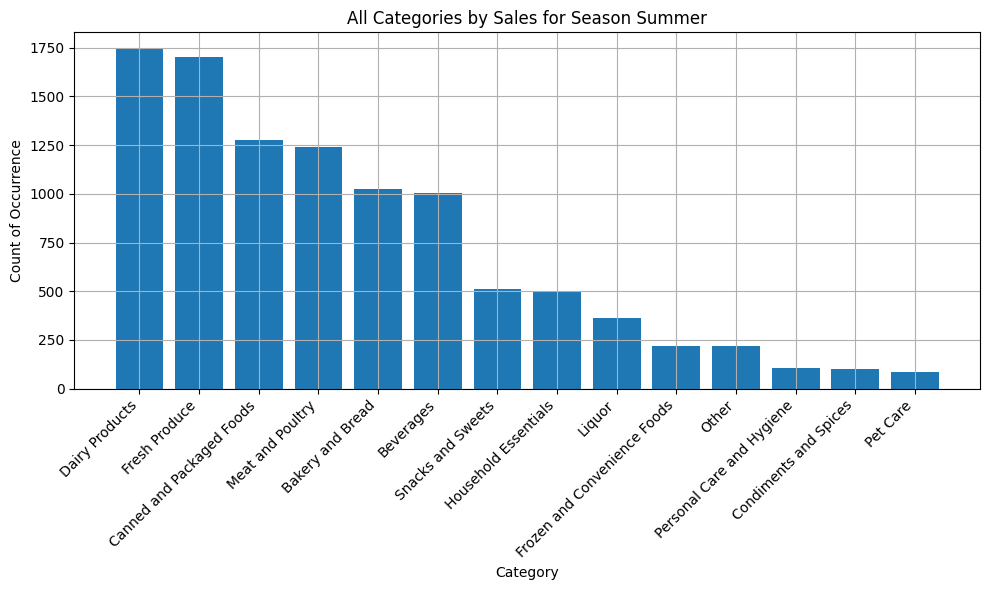

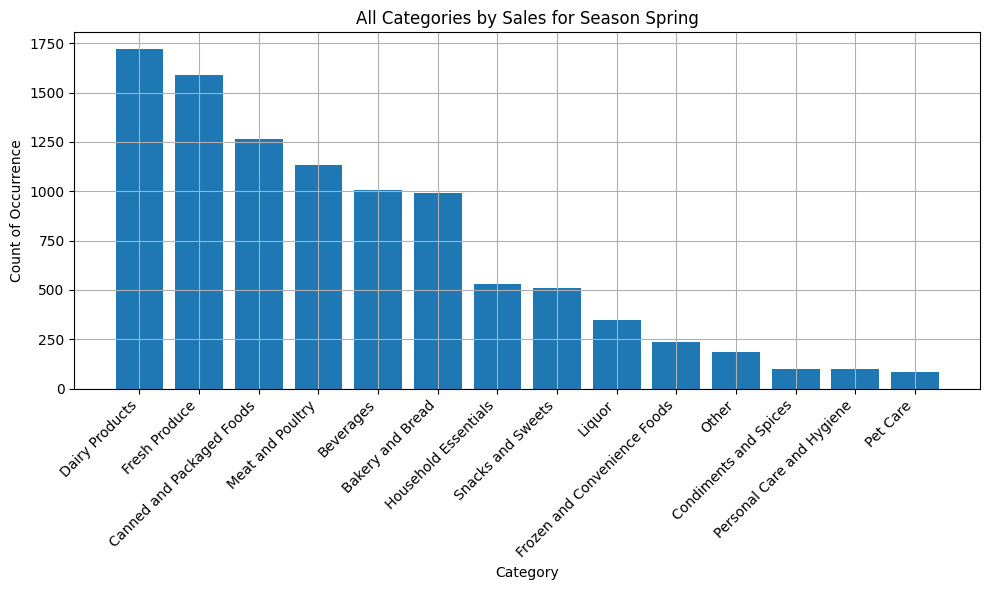

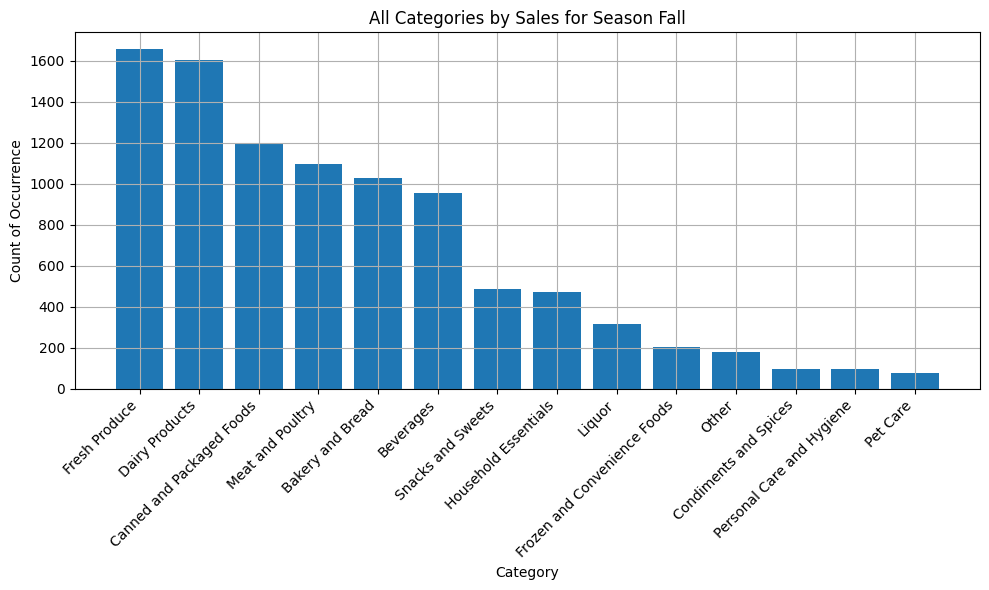

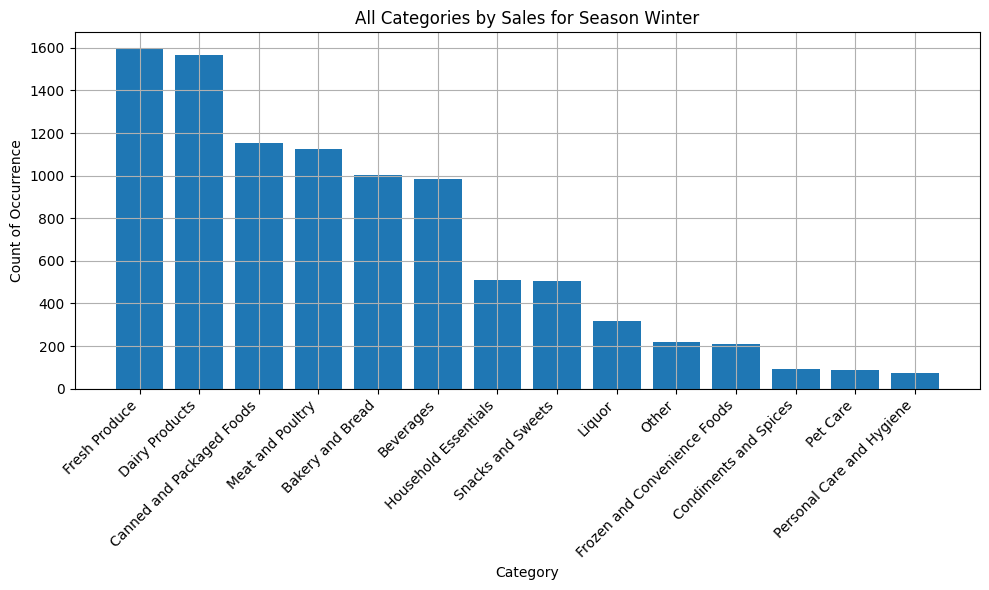

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with a 'month' column containing month numbers (1 to 12)
# and a new 'category' column based on the item descriptions

season_mapping = {
    1: 'Winter', 2: 'Winter', 3: 'Spring',
    4: 'Spring', 5: 'Spring', 6: 'Summer',
    7: 'Summer', 8: 'Summer', 9: 'Fall',
    10: 'Fall', 11: 'Fall', 12: 'Winter'
}

df['season'] = df['month'].map(season_mapping)

# Function to categorize items based on the provided dictionary
def categorize_item(item):
    for category, items in categories.items():
        if item in items:
            return category
    return 'Other'

df['category'] = df['itemDescription'].apply(categorize_item)

# Group by season and category to get the sales counts for each category in each season
category_sales_by_season = df.groupby(['season', 'category']).size().reset_index(name='Count')

# Get all the categories for each season
top_14_categories_by_season = category_sales_by_season.groupby('season').apply(lambda x: x.nlargest(14, 'Count')).reset_index(drop=True)

# Plot all the categories for each season
seasons = df['season'].unique()
for season in seasons:
    plt.figure(figsize=(10, 6))
    data = top_14_categories_by_season[top_14_categories_by_season['season'] == season]
    plt.bar(data['category'], data['Count'])
    plt.xlabel('Category')
    plt.ylabel('Count of Occurrence')
    plt.title(f'All Categories by Sales for Season {season}')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


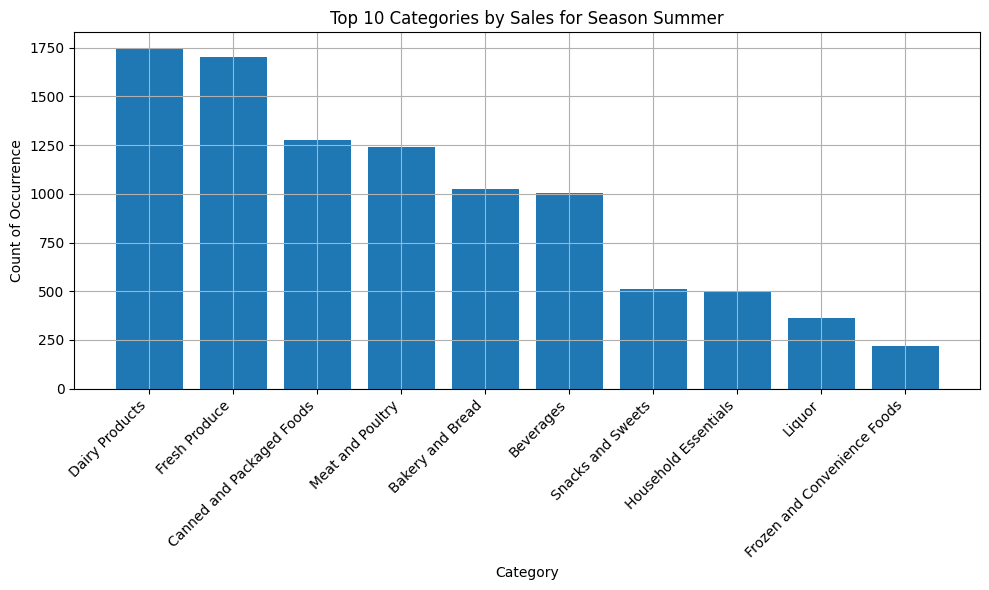

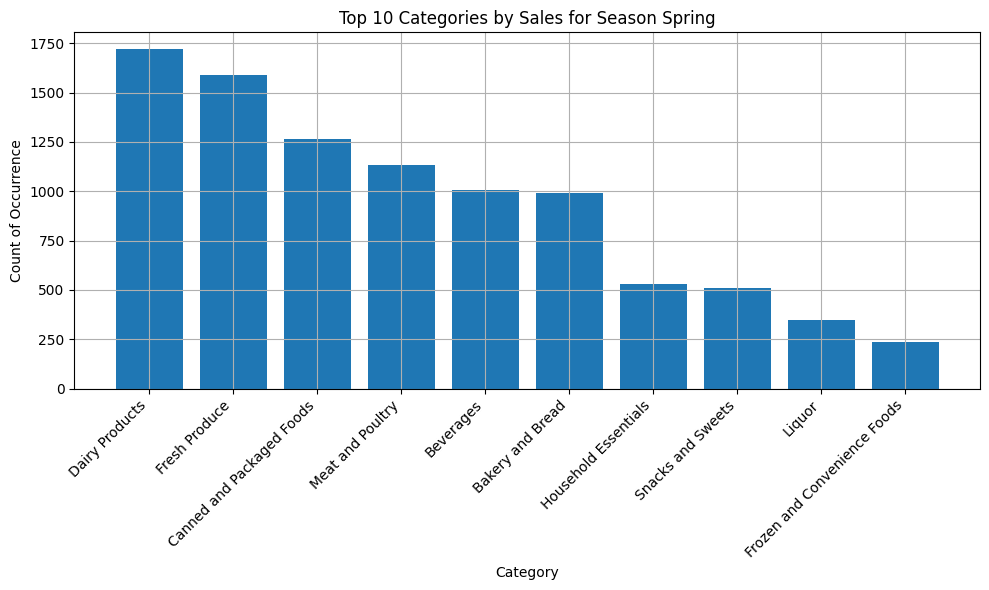

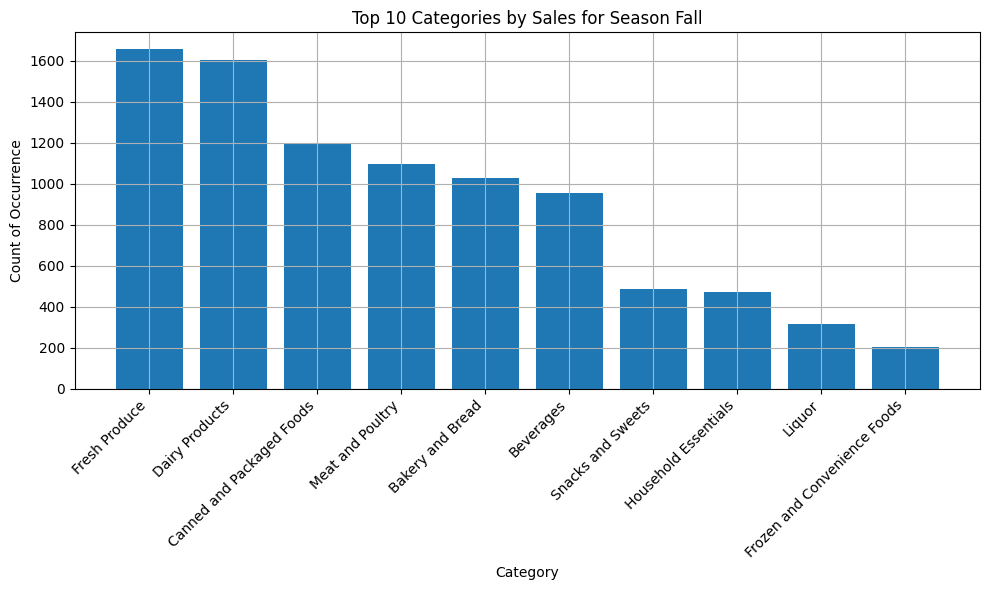

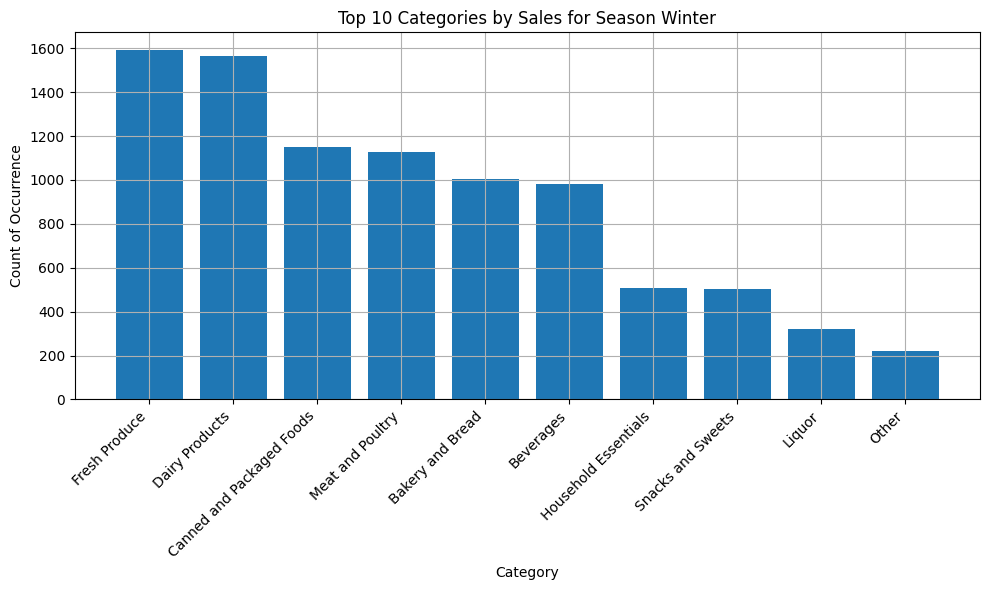

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with a 'month' column containing month numbers (1 to 12)
# and a new 'category' column based on the item descriptions

season_mapping = {
    1: 'Winter', 2: 'Winter', 3: 'Spring',
    4: 'Spring', 5: 'Spring', 6: 'Summer',
    7: 'Summer', 8: 'Summer', 9: 'Fall',
    10: 'Fall', 11: 'Fall', 12: 'Winter'
}

df['season'] = df['month'].map(season_mapping)

# Function to categorize items based on the provided dictionary
def categorize_item(item):
    for category, items in categories.items():
        if item in items:
            return category
    return 'Other'

df['category'] = df['itemDescription'].apply(categorize_item)

# Group by season and category to get the sales counts for each category in each season
category_sales_by_season = df.groupby(['season', 'category']).size().reset_index(name='Count')

# Get the top 10 categories for each season
top_10_categories_by_season = category_sales_by_season.groupby('season').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

# Plot the top 10 categories for each season
seasons = df['season'].unique()
for season in seasons:
    plt.figure(figsize=(10, 6))
    data = top_10_categories_by_season[top_10_categories_by_season['season'] == season]
    plt.bar(data['category'], data['Count'])
    plt.xlabel('Category')
    plt.ylabel('Count of Occurrence')
    plt.title(f'Top 10 Categories by Sales for Season {season}')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()


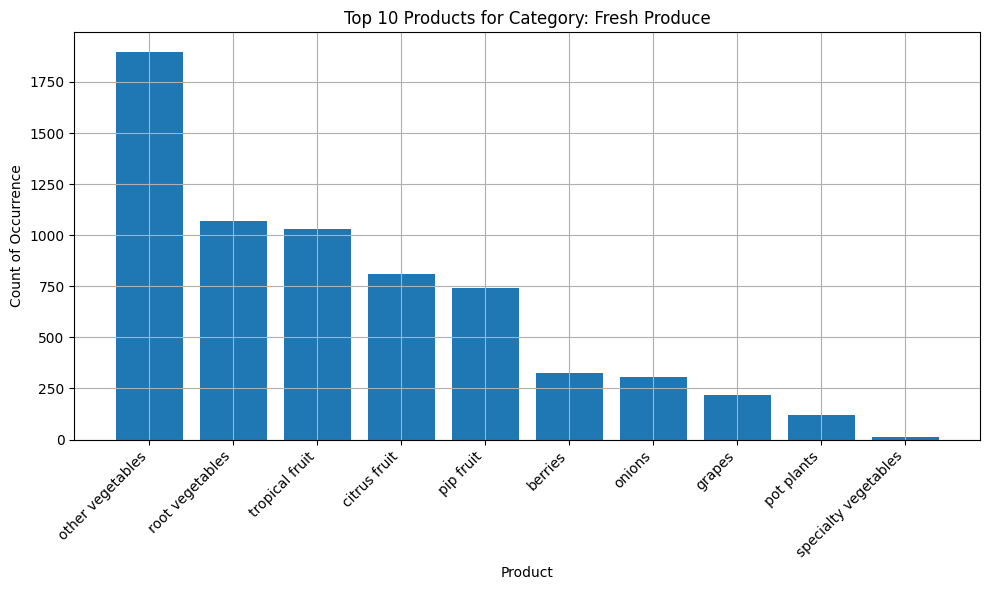

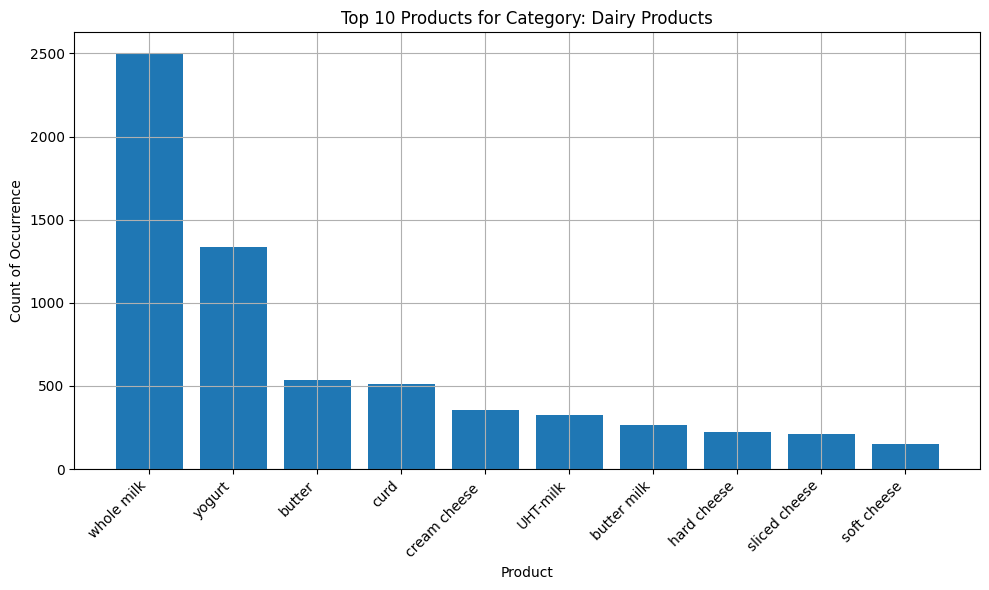

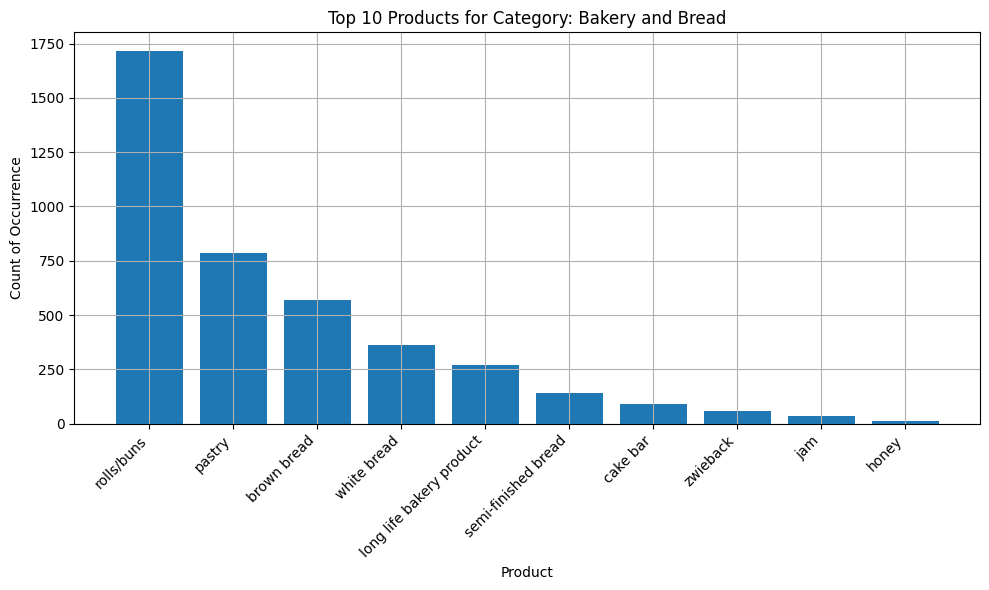

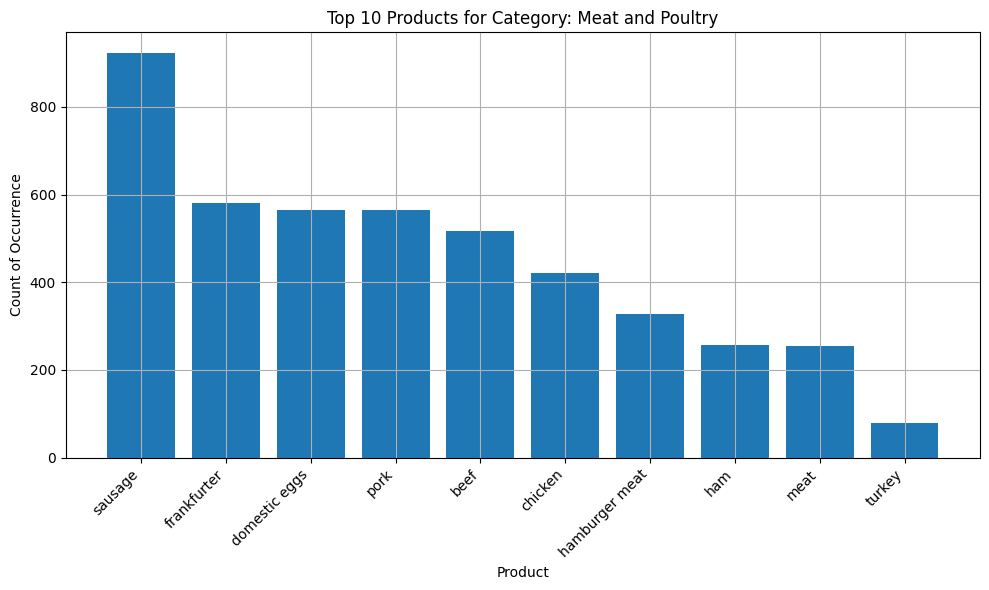

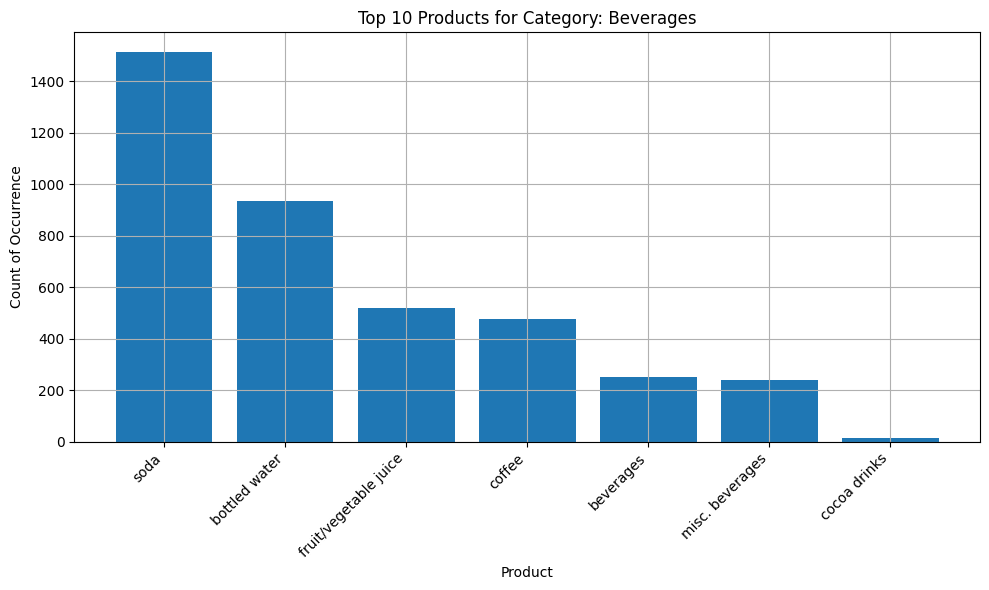

...

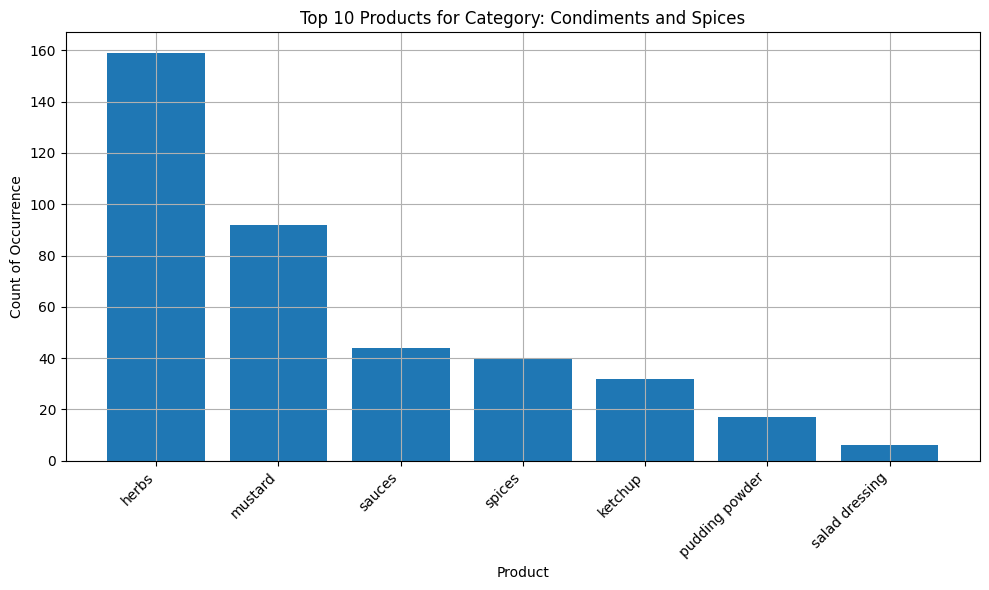

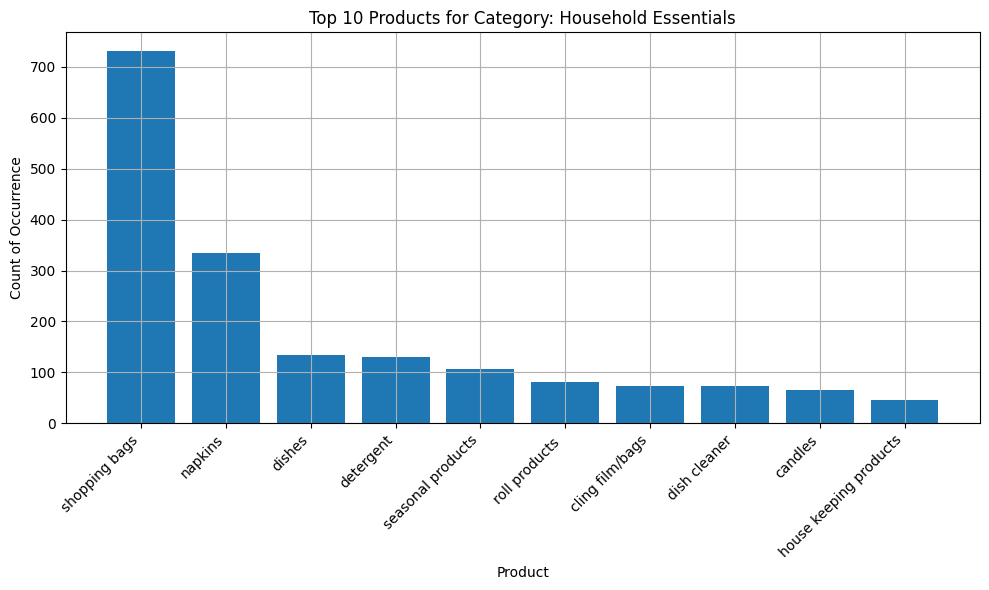

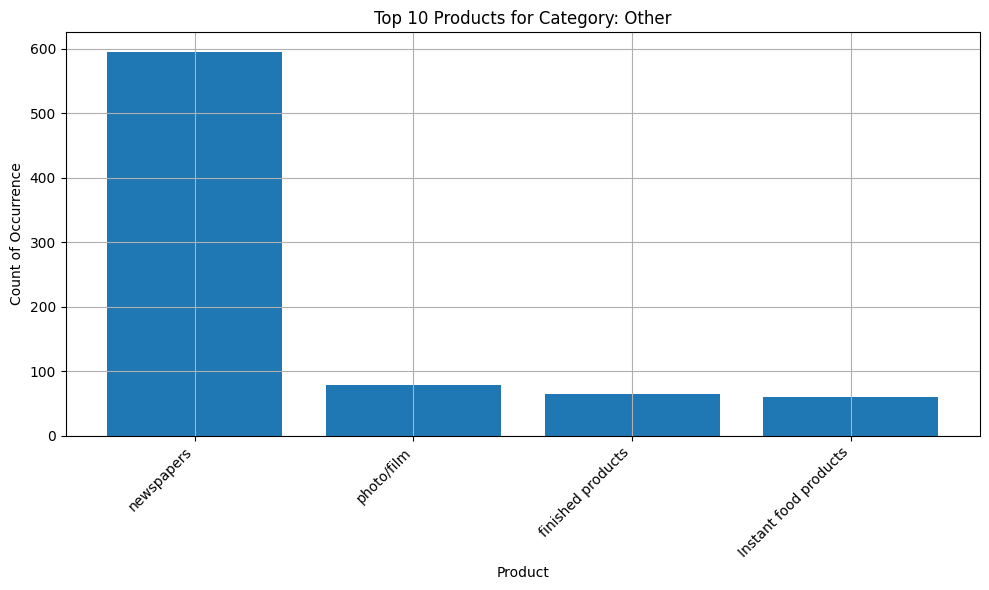

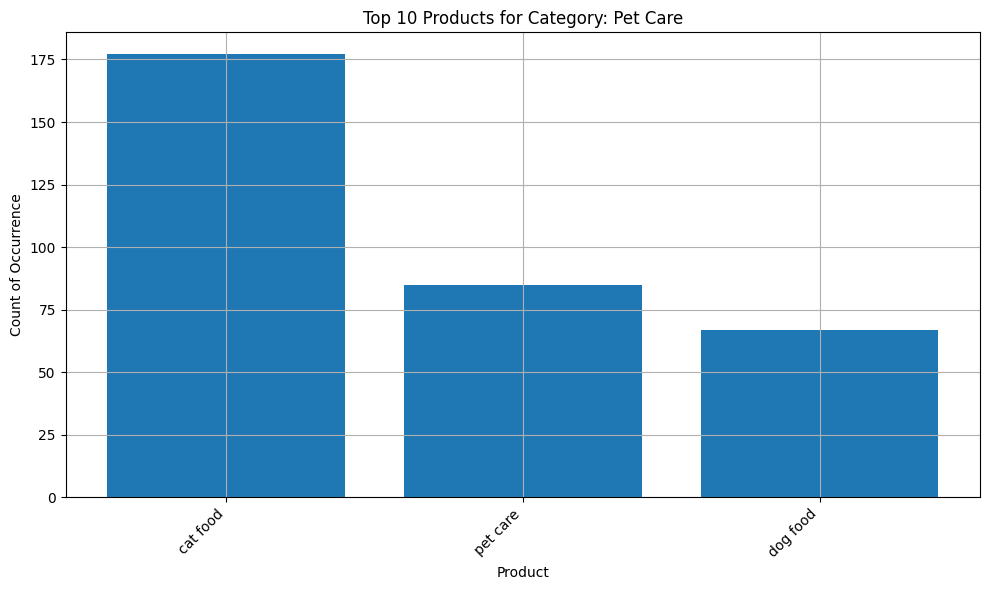

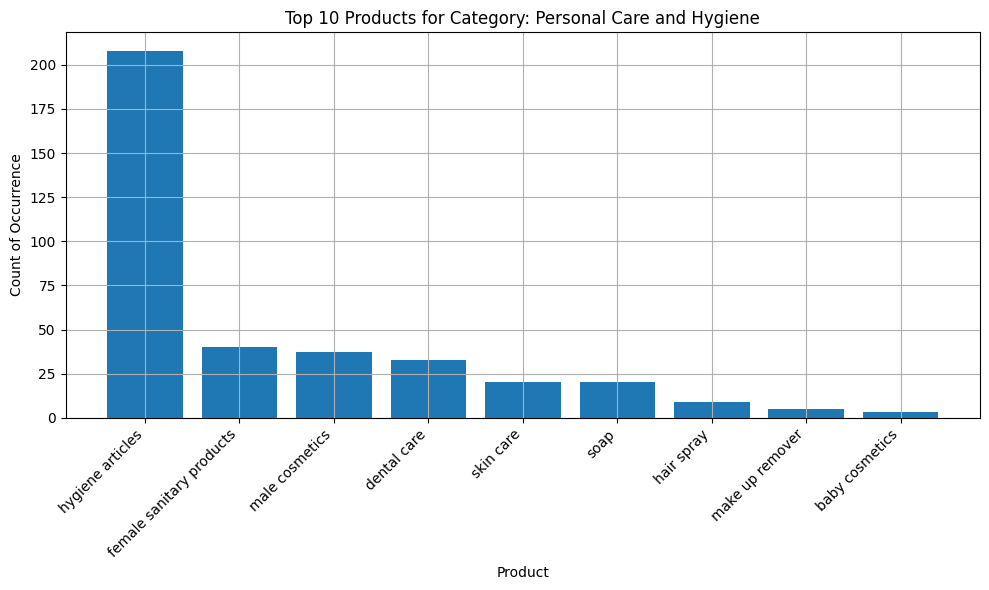

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with a 'month' column containing month numbers (1 to 12)
# and a new 'category' column based on the item descriptions

season_mapping = {
    1: 'Winter', 2: 'Winter', 3: 'Spring',
    4: 'Spring', 5: 'Spring', 6: 'Summer',
    7: 'Summer', 8: 'Summer', 9: 'Fall',
    10: 'Fall', 11: 'Fall', 12: 'Winter'
}

df['season'] = df['month'].map(season_mapping)

# Function to categorize items based on the provided dictionary
def categorize_item(item):
    for category, items in categories.items():
        if item in items:
            return category
    return 'Other'

df['category'] = df['itemDescription'].apply(categorize_item)

# Group by category and itemDescription to get the sales counts for each item in each category
category_sales_by_item = df.groupby(['category', 'itemDescription']).size().reset_index(name='Count')

# Get the top 10 products for each category
top_10_products_by_category = category_sales_by_item.groupby('category').apply(lambda x: x.nlargest(10, 'Count')).reset_index(drop=True)

# Plot the top 10 products for each category
categories = df['category'].unique()
for category in categories:
    plt.figure(figsize=(10, 6))
    data = top_10_products_by_category[top_10_products_by_category['category'] == category]
    plt.bar(data['itemDescription'], data['Count'])
    plt.xlabel('Product')
    plt.ylabel('Count of Occurrence')
    plt.title(f'Top 10 Products for Category: {category}')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


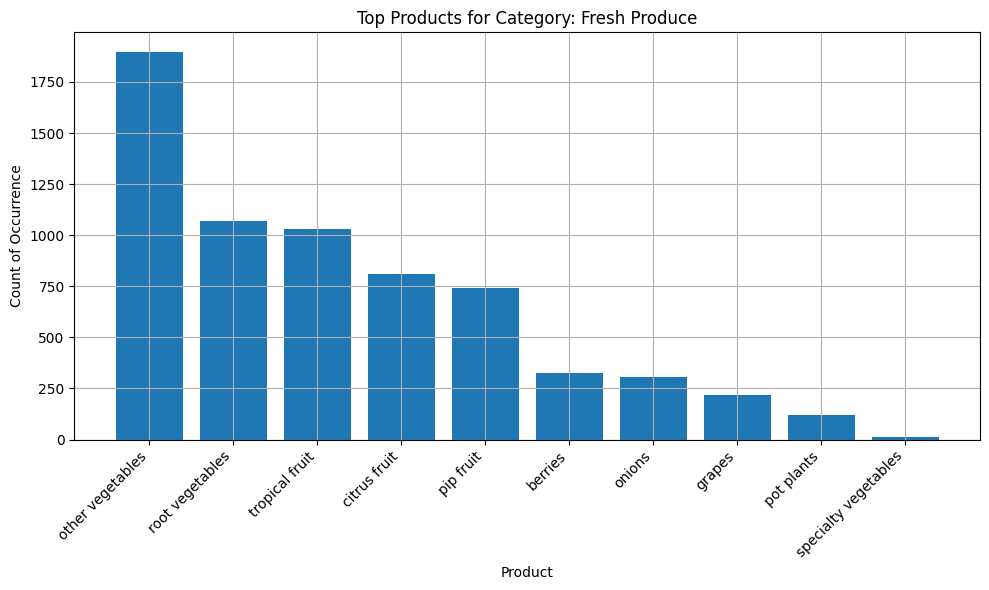

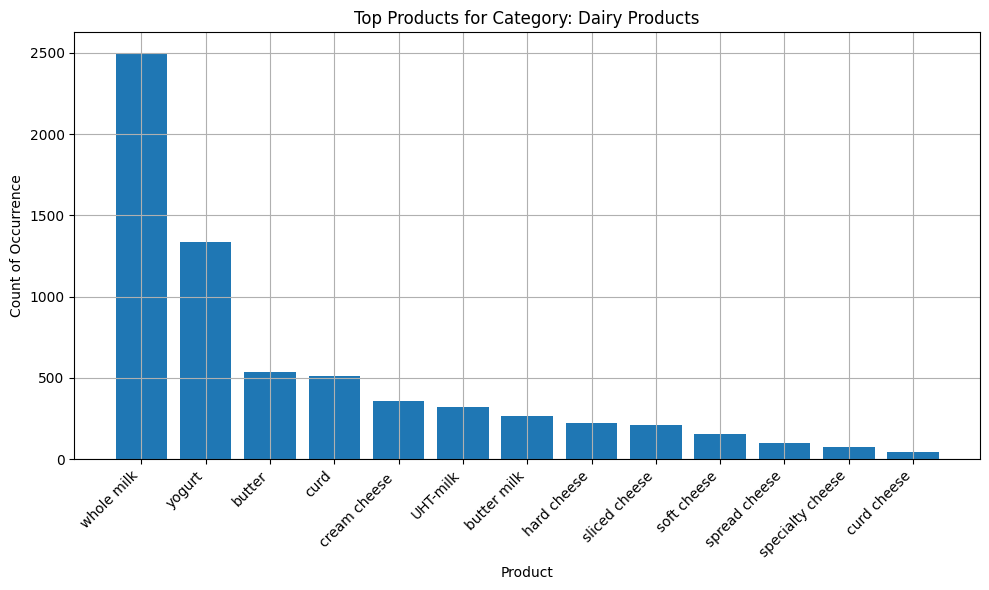

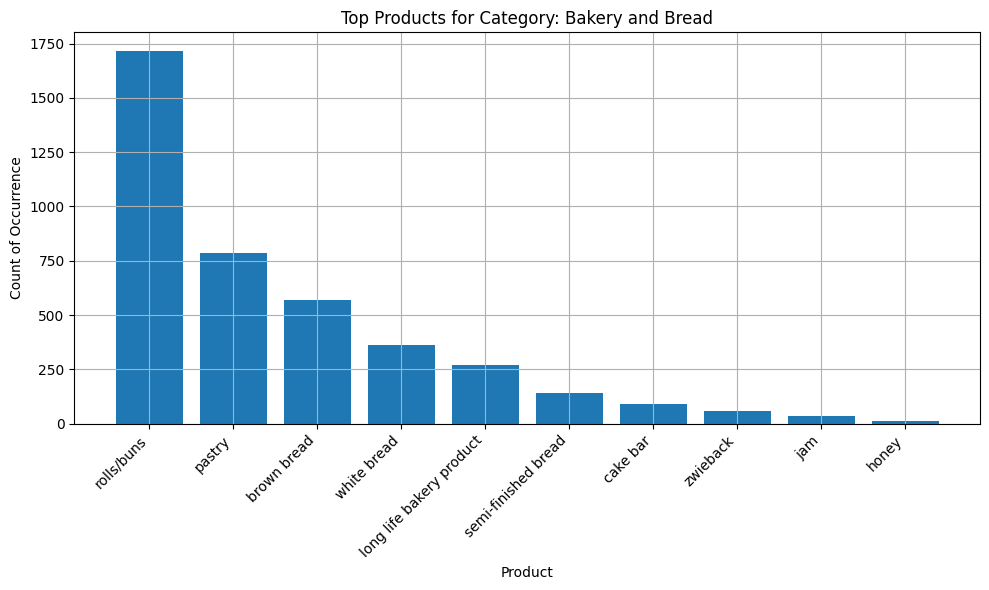

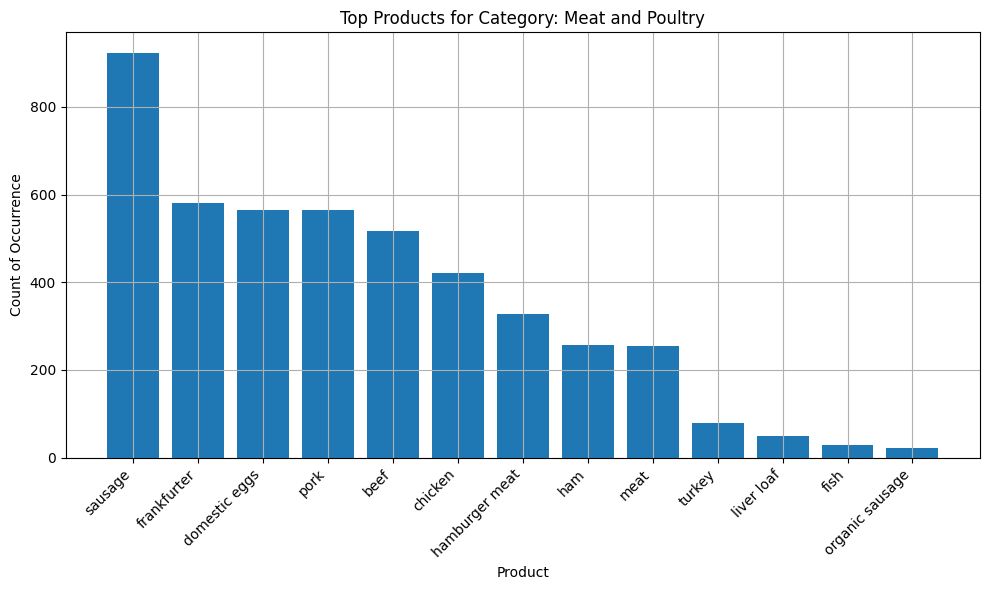

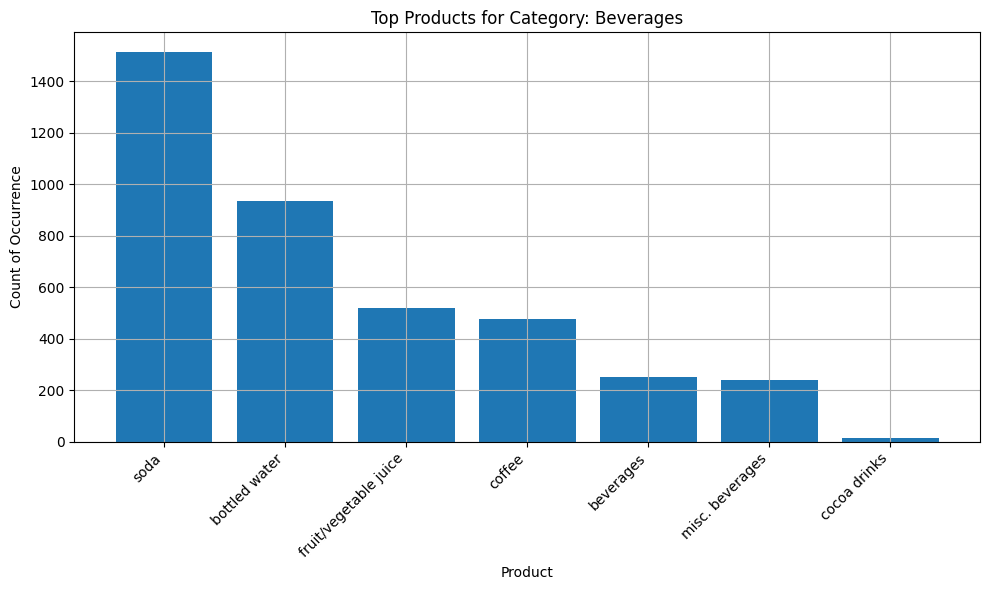

...

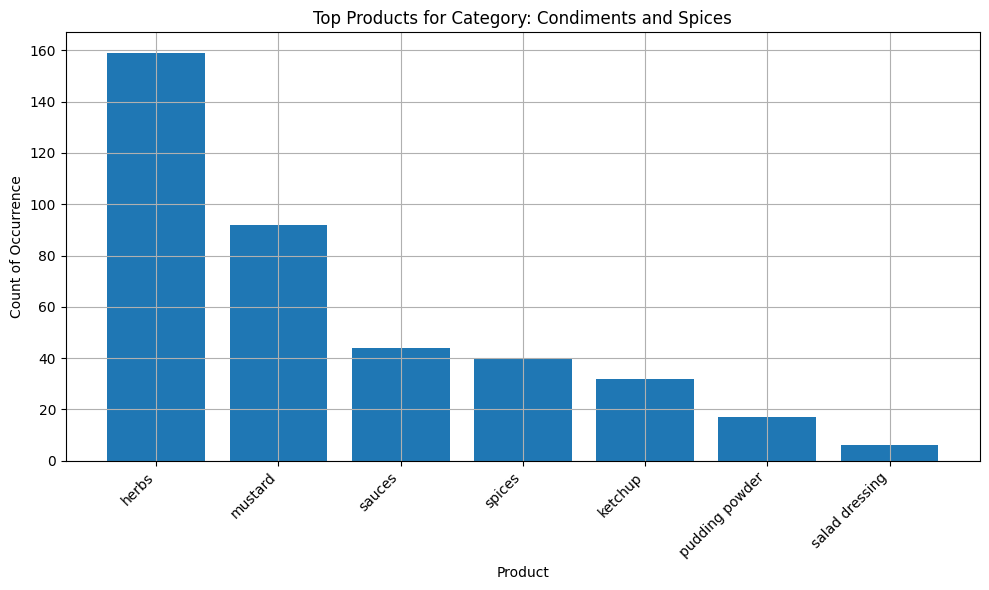

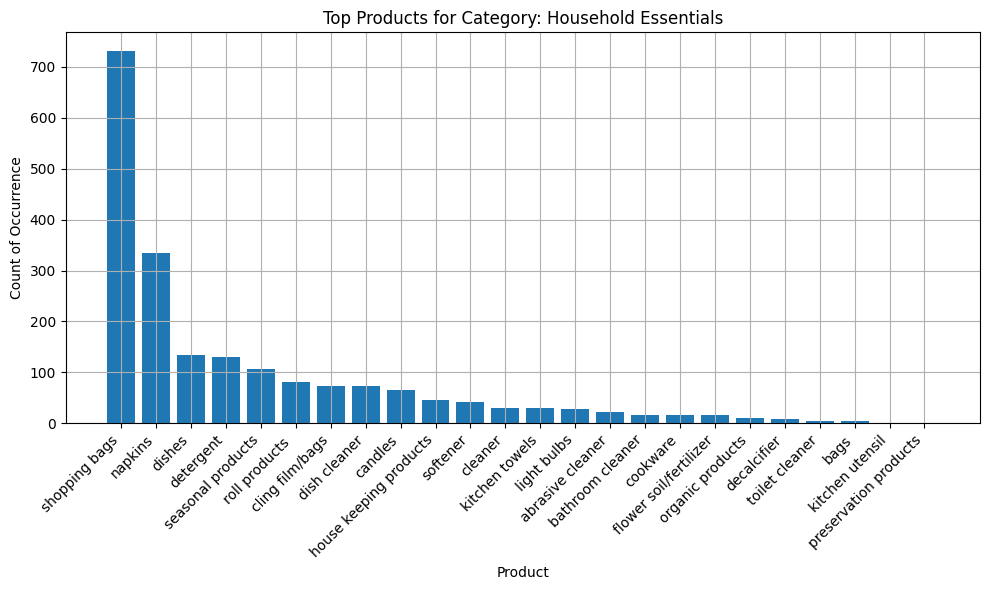

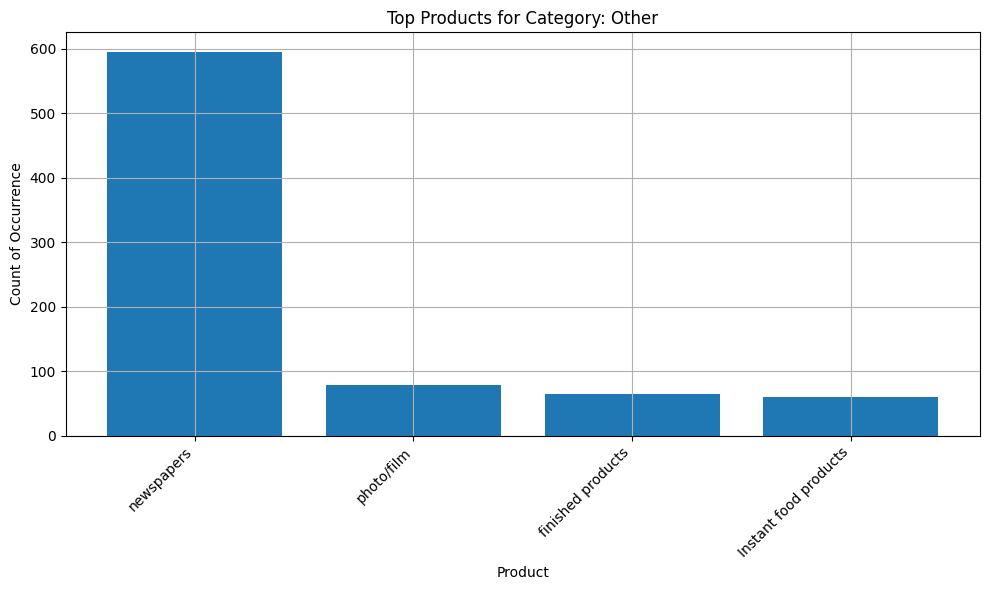

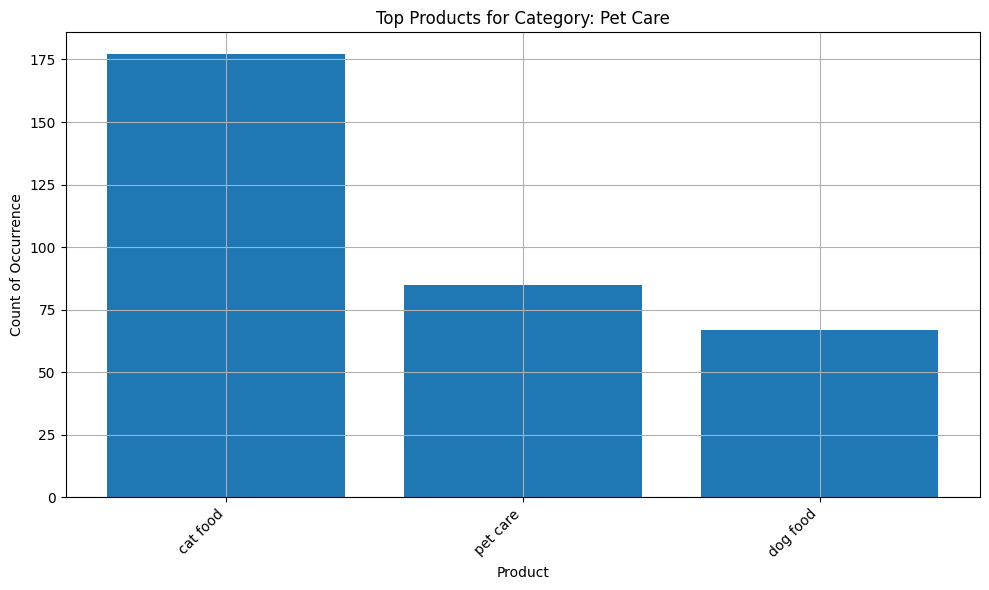

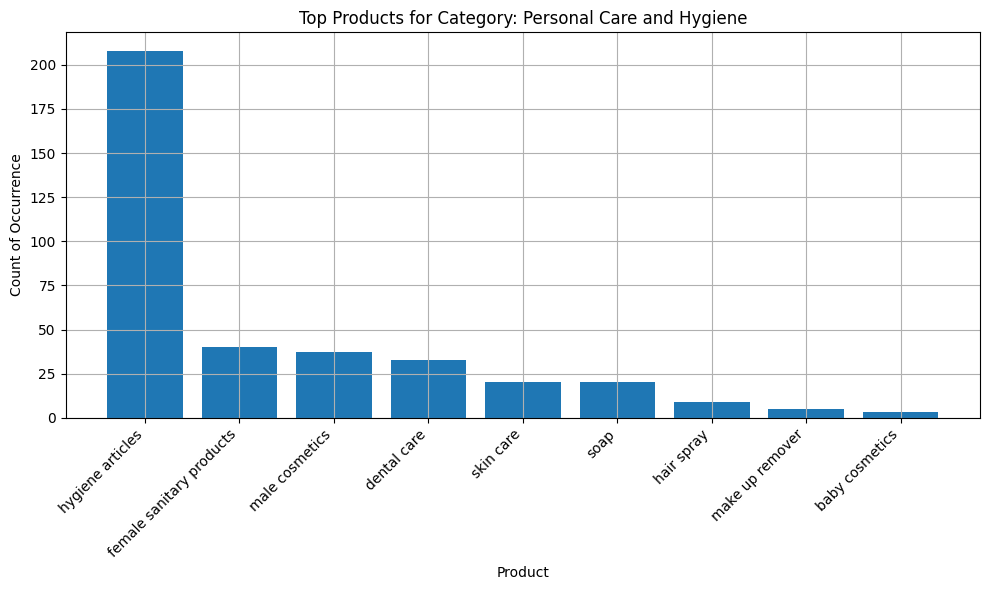

In [ ]:
# Group by category and itemDescription to get the sales counts for each item in each category
category_sales_by_item = df.groupby(['category', 'itemDescription']).size().reset_index(name='Count')

# Sort by category and sales count in descending order
category_sales_by_item.sort_values(by=['category', 'Count'], ascending=[True, False], inplace=True)

for category in categories:
    plt.figure(figsize=(10, 6))
    data = category_sales_by_item[category_sales_by_item['category'] == category]
    plt.bar(data['itemDescription'], data['Count'])
    plt.xlabel('Product')
    plt.ylabel('Count of Occurrence')
    plt.title(f'Top Products for Category: {category}')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

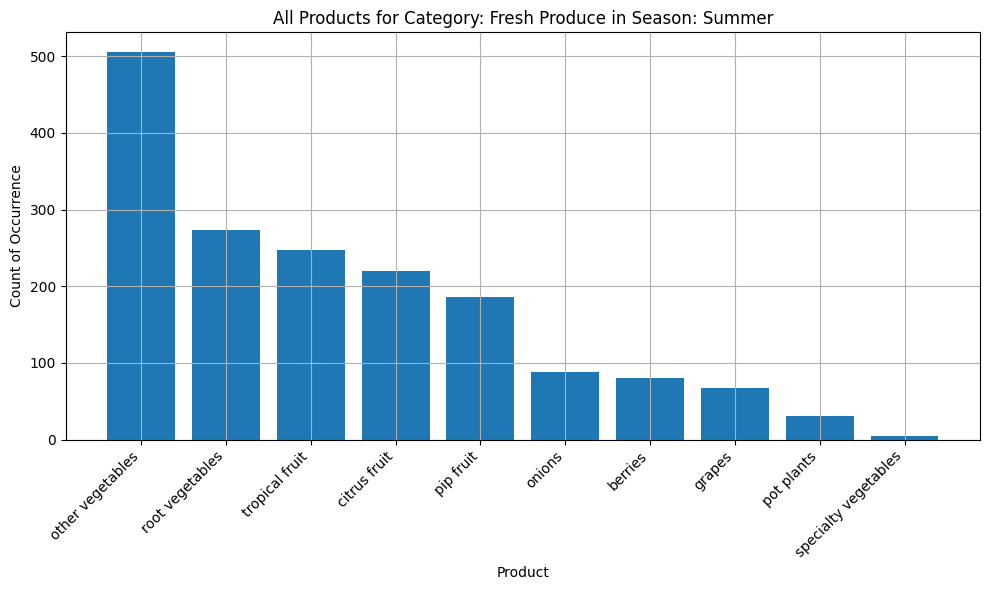

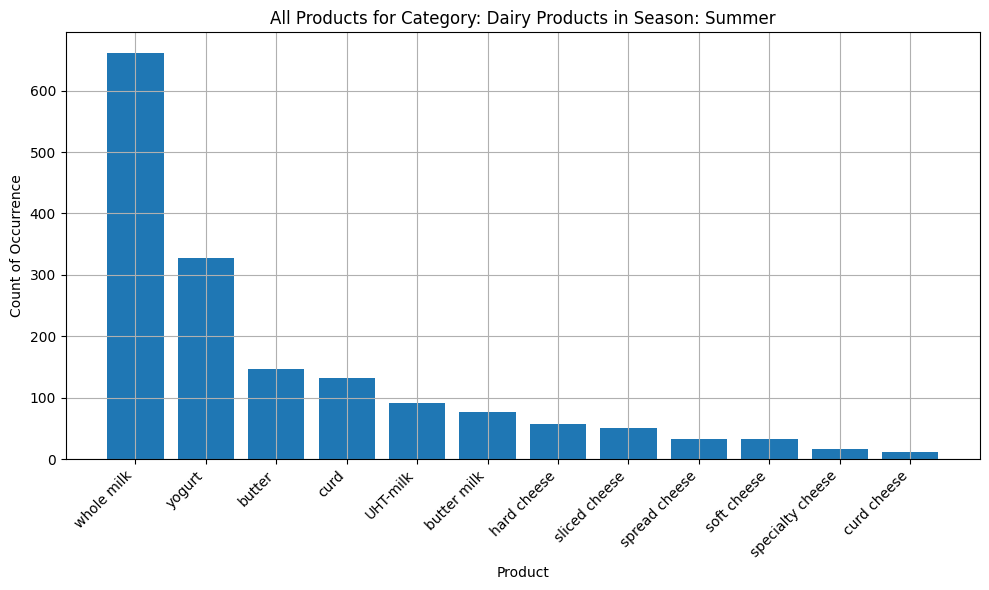

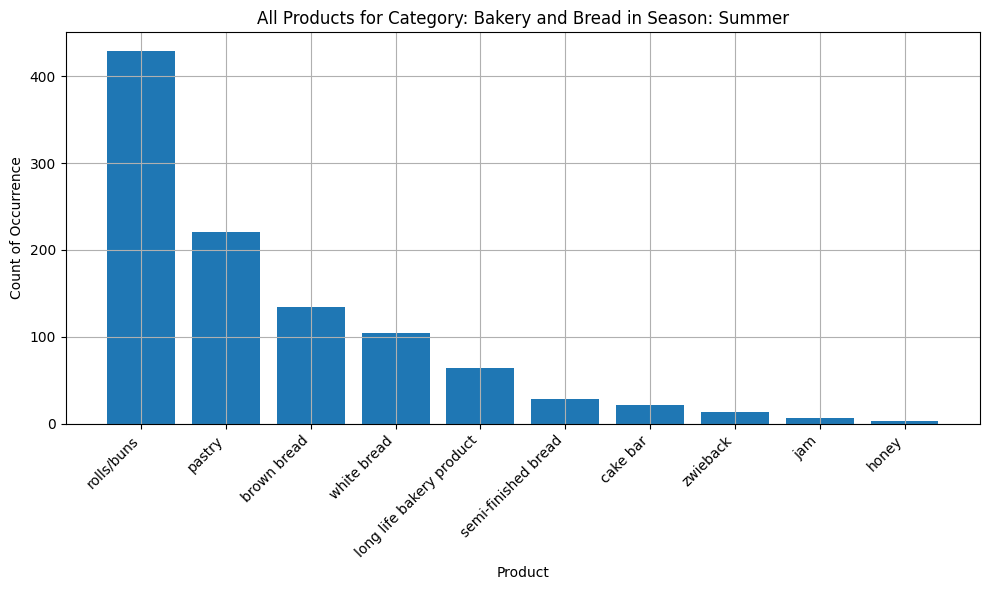

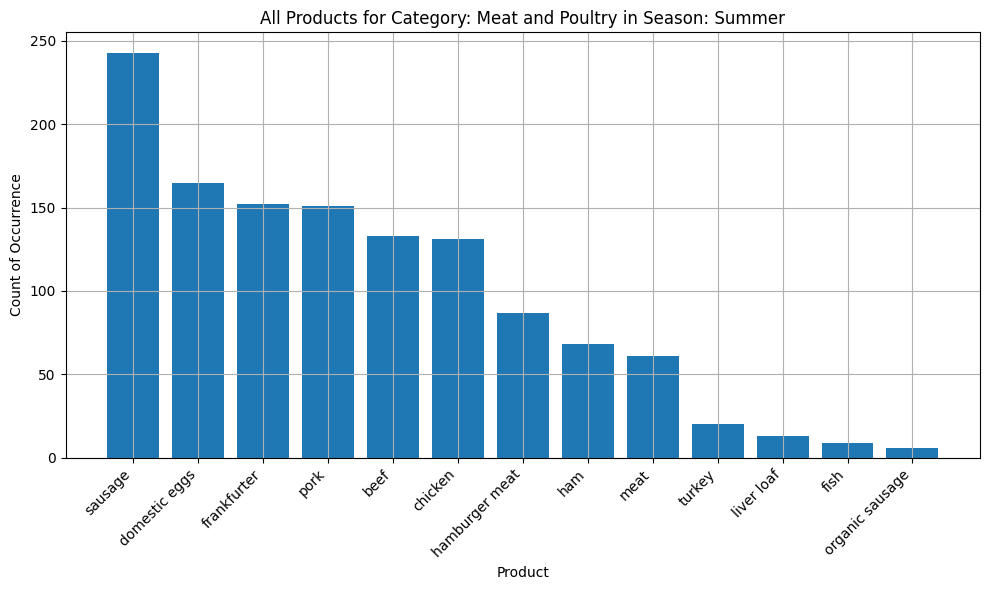

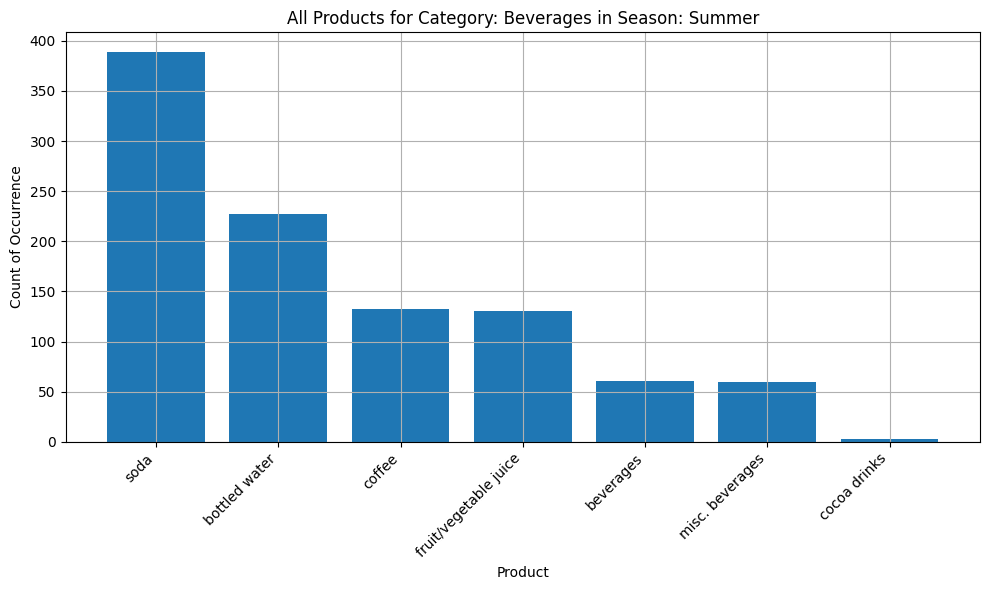

...

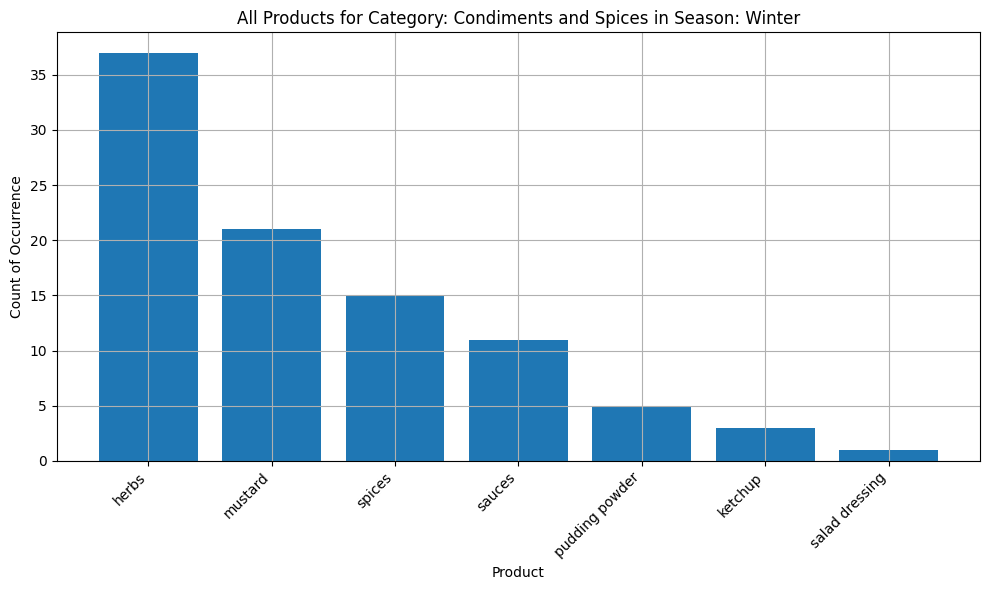

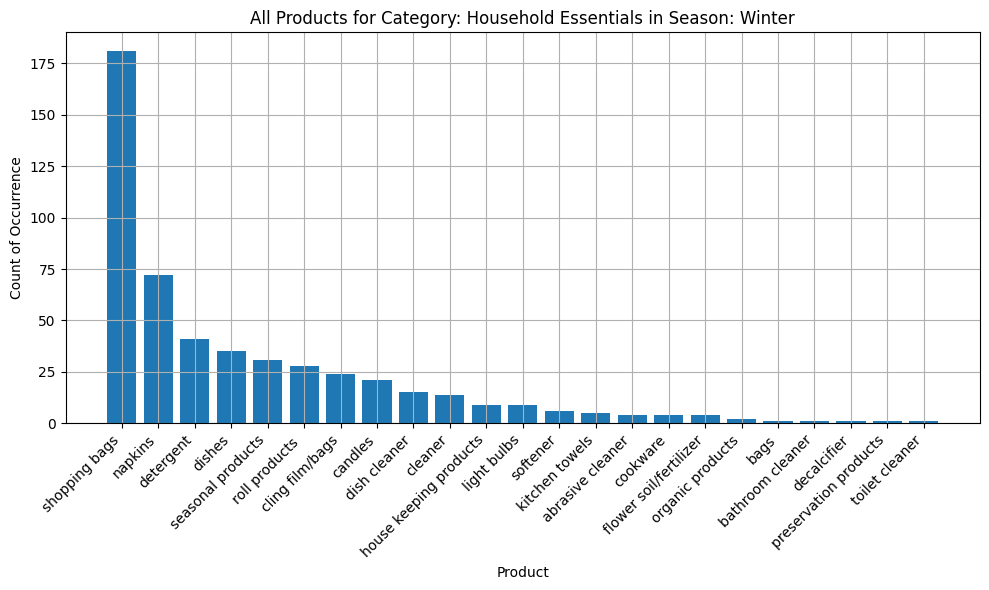

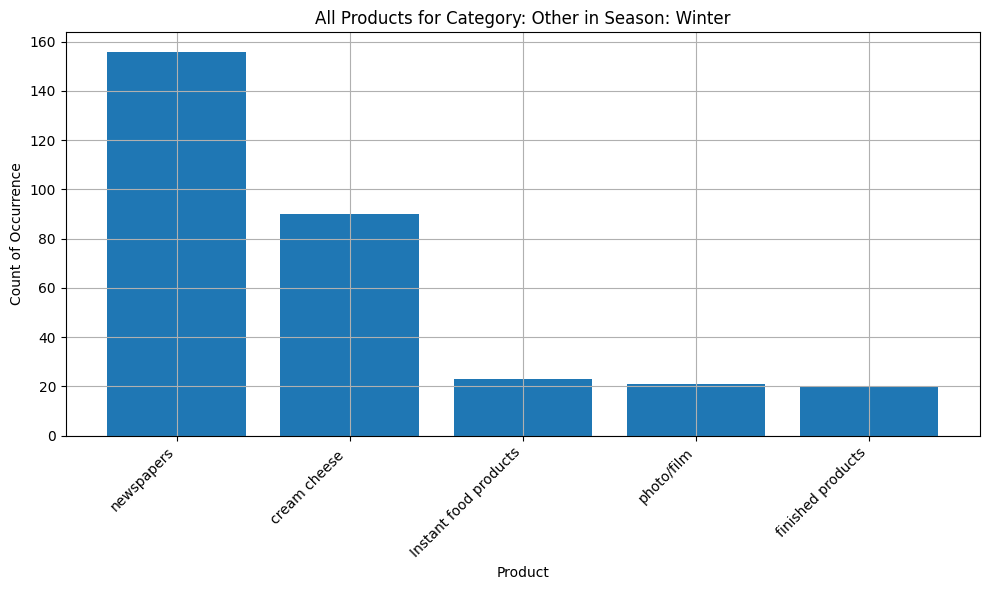

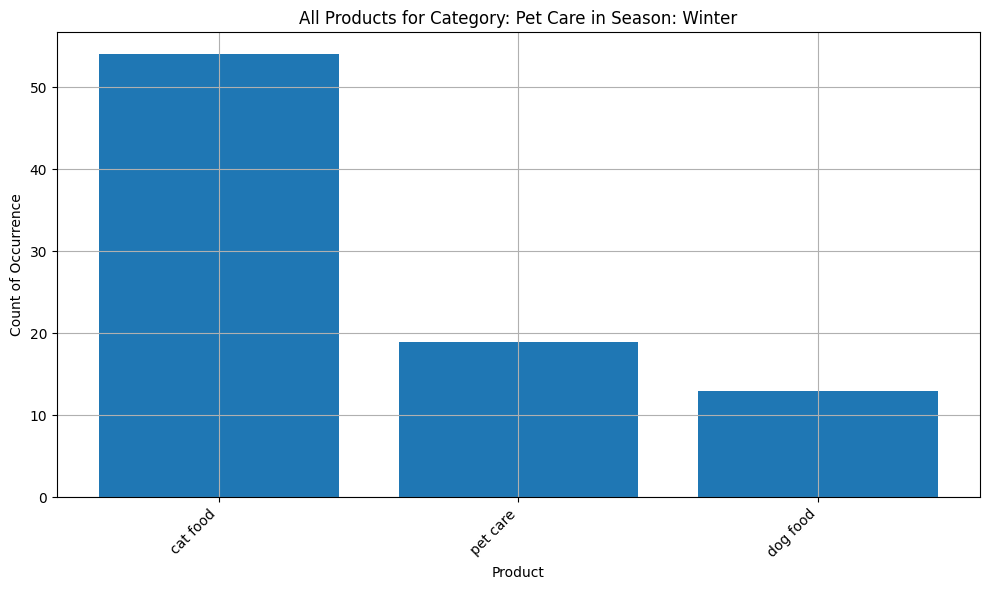

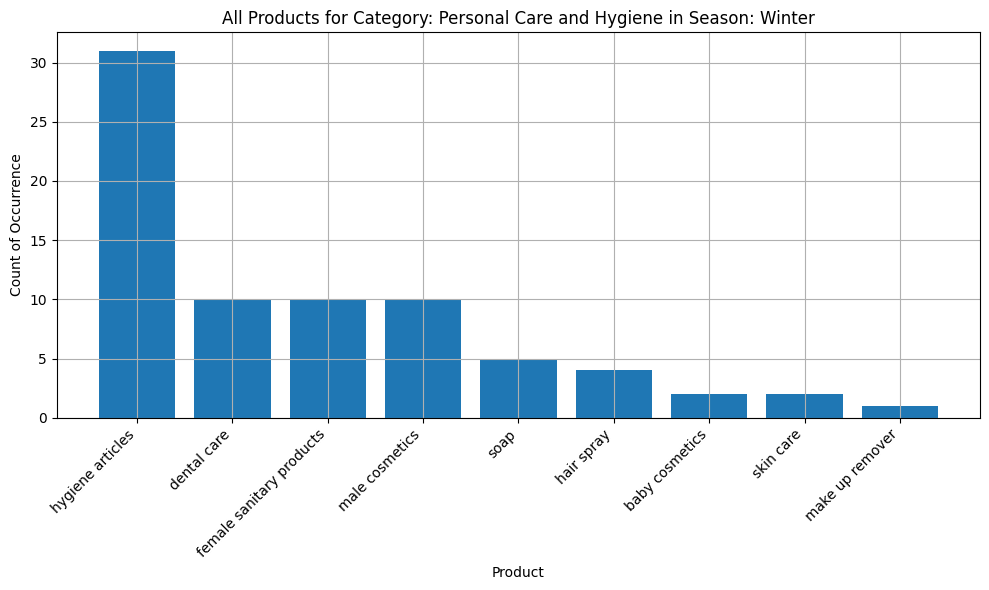

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with a 'month' column containing month numbers (1 to 12)
# and a new 'category' column based on the item descriptions

season_mapping = {
    1: 'Winter', 2: 'Winter', 3: 'Spring',
    4: 'Spring', 5: 'Spring', 6: 'Summer',
    7: 'Summer', 8: 'Summer', 9: 'Fall',
    10: 'Fall', 11: 'Fall', 12: 'Winter'
}

df['season'] = df['month'].map(season_mapping)

# Define the categories dictionary
categories = {
    'Fresh Produce': ['tropical fruit', 'pip fruit', 'other vegetables', 'citrus fruit', 'pot plants', 'root vegetables',
                      'berries', 'grapes', 'onions', 'specialty vegetables'],
    'Dairy Products': ['whole milk', 'butter', 'butter milk', 'yogurt', 'curd cheese', 'cream cheese', 'hard cheese',
                       'sliced cheese', 'specialty cheese', 'UHT-milk', 'curd', 'spread cheese', 'soft cheese'],
    'Meat and Poultry': ['beef', 'organic sausage', 'chicken', 'frankfurter', 'sausage', 'ham', 'turkey', 'pork', 'hamburger meat', 'domestic eggs', 'fish', 'meat', 'liver loaf'],
    'Liquor': ['whisky', 'prosecco', 'liqueur', 'bottled beer', 'red/blush wine', 'white wine', 'liquor', 'sparkling wine', 'liquor (appetizer)', 'rubbing alcohol',
               'brandy', 'rum'],
    'Beverages': ['beverages', 'fruit/vegetable juice', 'bottled water', 'soda', 'coffee', 'cocoa drinks', 'misc. beverages'],
    'Snacks and Sweets': ['chocolate', 'snack products', 'specialty bar', 'candy', 'specialty chocolate', 'chocolate marshmallow',
                          'sweet spreads', 'waffles', 'sweeteners', 'chewing gum', 'specialty fat', 'candy', 'nut snack', 'nuts/prunes', 'salty snack'],
    'Bakery and Bread': ['rolls/buns', 'brown bread', 'long life bakery product', 'zwieback', 'honey', 'jam','cake bar', 'pastry', 'white bread', 'semi-finished bread'],
    'Frozen and Convenience Foods': ['frozen potato products', 'frozen meals', 'frozen vegetables', 'frozen chicken',
                                     'frozen fish', 'frozen fruits', 'instant food products'],
    'Canned and Packaged Foods': ['packaged fruit/vegetables', 'canned beer', 'canned fruit', 'canned vegetables',
                                  'canned fish', 'salt', 'oil', 'whipped/sour cream', 'vinegar', 'syrup', 'cream', 'cooking chocolate',
                                  'flower (seeds)', 'rice', 'tea', 'meat spreads', 'artif. sweetener', 'canned vegetables', 'baking powder',
                                  'margarine', 'frozen dessert', 'potato products', 'tidbits','flour', 'sugar', 'processed cheese',
                                  'pasta', 'popcorn','dessert', 'condensed milk', 'ice cream', 'pickled vegetables'
                                  , 'soups', 'instant coffee', 'cereals', 'mayonnaise', 'ready soups'],
    'Condiments and Spices': ['herbs', 'spices', 'mustard', 'sauces', 'salad dressing', 'pudding powder', 'ketchup'],
    'Household Essentials': ['detergent', 'cleaner', 'decalcifier', 'shopping bags', 'cling film/bags',
                             'napkins', 'kitchen towels', 'candles', 'light bulbs',
                             'flower soil/fertilizer', 'dish cleaner', 'cleaner', 'abrasive cleaner', 'seasonal products',
                             'organic products', 'candles', 'kitchen utensil', 'softener', 'dishes', 'preservation products', 'roll products ',
                             'house keeping products' , 'cookware', 'bathroom cleaner', 'bags', 'toilet cleaner'],
    'Personal Care and Hygiene': ['hair spray', 'soap', 'female sanitary products', 'dental care',
                                  'skin care', 'rubbing alcohol', 'hygiene articles', 'make up remover', 'skin care', 'male cosmetics', 'baby cosmetics'],
    'Pet Care': ['dog food', 'cat food', 'pet care'],
    'Other': ['newspapers', 'photo/film']
}

# Function to categorize items based on the provided dictionary
def categorize_item(item):
    for category, items in categories.items():
        if item in items:
            return category
    return 'Other'

df['category'] = df['itemDescription'].apply(categorize_item)

# Group by season, category, and itemDescription to get the sales counts for each item in each category in each season
category_sales_by_season = df.groupby(['season', 'category', 'itemDescription']).size().reset_index(name='Count')

# Sort the products in each category by count in descending order
category_sales_by_season.sort_values(['season', 'category', 'Count'], ascending=[True, True, False], inplace=True)

# Plot all products for each category in each season
seasons = df['season'].unique()
for season in seasons:
    categories = df['category'].unique()
    for category in categories:
        plt.figure(figsize=(10, 6))
        data = category_sales_by_season[
            (category_sales_by_season['season'] == season) &
            (category_sales_by_season['category'] == category)
        ]
        plt.bar(data['itemDescription'], data['Count'])
        plt.xlabel('Product')
        plt.ylabel('Count of Occurrence')
        plt.title(f'All Products for Category: {category} in Season: {season}')
        plt.xticks(rotation=45, ha='right')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


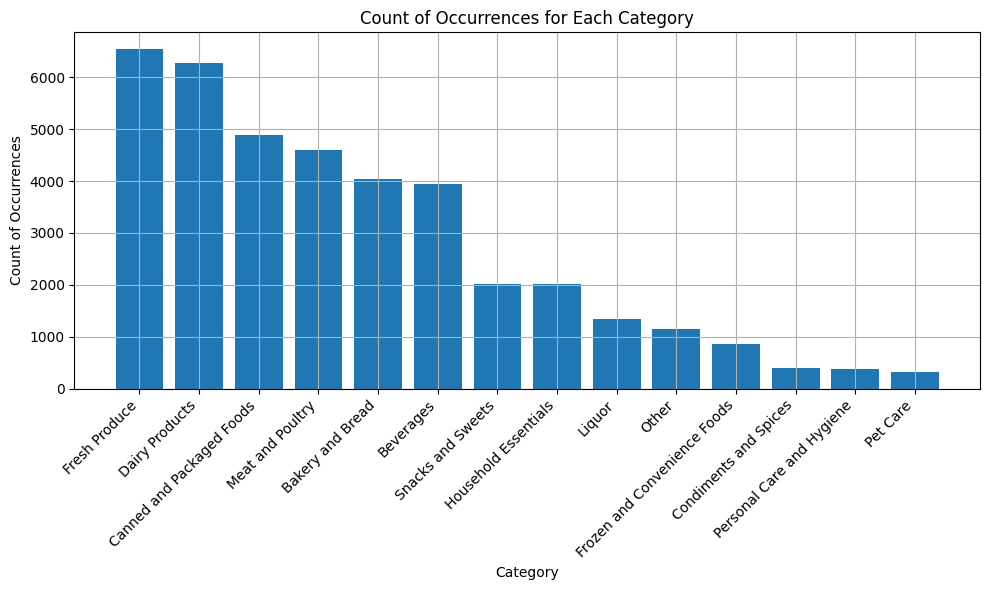

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame named 'df' with a 'month' column containing month numbers (1 to 12)
# and a new 'category' column based on the item descriptions

season_mapping = {
    1: 'Winter', 2: 'Winter', 3: 'Spring',
    4: 'Spring', 5: 'Spring', 6: 'Summer',
    7: 'Summer', 8: 'Summer', 9: 'Fall',
    10: 'Fall', 11: 'Fall', 12: 'Winter'
}

df['season'] = df['month'].map(season_mapping)

categories = {
    'Fresh Produce': ['tropical fruit', 'pip fruit', 'other vegetables', 'citrus fruit', 'pot plants', 'root vegetables',
                      'berries', 'grapes', 'onions', 'specialty vegetables'],
    'Dairy Products': ['whole milk', 'butter', 'butter milk', 'yogurt', 'curd cheese', 'cream cheese', 'hard cheese',
                       'sliced cheese', 'specialty cheese', 'UHT-milk', 'curd', 'spread cheese', 'soft cheese'],
    'Meat and Poultry': ['beef', 'organic sausage', 'chicken', 'frankfurter', 'sausage', 'ham', 'turkey', 'pork', 'hamburger meat', 'domestic eggs', 'fish', 'meat', 'liver loaf'],
    'Liquor': ['whisky', 'prosecco', 'liqueur', 'bottled beer', 'red/blush wine', 'white wine', 'liquor', 'sparkling wine', 'liquor (appetizer)', 'rubbing alcohol',
               'brandy', 'rum'],
    'Beverages': ['beverages', 'fruit/vegetable juice', 'bottled water', 'soda', 'coffee', 'cocoa drinks', 'misc. beverages'],
    'Snacks and Sweets': ['chocolate', 'snack products', 'specialty bar', 'candy', 'specialty chocolate', 'chocolate marshmallow',
                          'sweet spreads', 'waffles', 'sweeteners', 'chewing gum', 'specialty fat', 'candy', 'nut snack', 'nuts/prunes', 'salty snack'],
    'Bakery and Bread': ['rolls/buns', 'brown bread', 'long life bakery product', 'zwieback', 'honey', 'jam','cake bar', 'pastry', 'white bread', 'semi-finished bread'],
    'Frozen and Convenience Foods': ['frozen potato products', 'frozen meals', 'frozen vegetables', 'frozen chicken',
                                     'frozen fish', 'frozen fruits', 'instant food products'],
    'Canned and Packaged Foods': ['packaged fruit/vegetables', 'canned beer', 'canned fruit', 'canned vegetables',
                                  'canned fish', 'salt', 'oil', 'whipped/sour cream', 'vinegar', 'syrup', 'cream', 'cooking chocolate',
                                  'flower (seeds)', 'rice', 'tea', 'meat spreads', 'artif. sweetener', 'canned vegetables', 'baking powder',
                                  'margarine', 'frozen dessert', 'potato products', 'tidbits','flour', 'sugar', 'processed cheese',
                                  'pasta', 'popcorn','dessert', 'condensed milk', 'ice cream', 'pickled vegetables'
                                  , 'soups', 'instant coffee', 'cereals', 'mayonnaise', 'ready soups'],
    'Condiments and Spices': ['herbs', 'spices', 'mustard', 'sauces', 'salad dressing', 'pudding powder', 'ketchup'],
    'Household Essentials': ['detergent', 'cleaner', 'decalcifier', 'shopping bags', 'cling film/bags',
                             'napkins', 'kitchen towels', 'candles', 'light bulbs',
                             'flower soil/fertilizer', 'dish cleaner', 'cleaner', 'abrasive cleaner', 'seasonal products',
                             'organic products', 'candles', 'kitchen utensil', 'softener', 'dishes', 'preservation products', 'roll products ',
                             'house keeping products' , 'cookware', 'bathroom cleaner', 'bags', 'toilet cleaner'],
    'Personal Care and Hygiene': ['hair spray', 'soap', 'female sanitary products', 'dental care',
                                  'skin care', 'rubbing alcohol', 'hygiene articles', 'make up remover', 'skin care', 'male cosmetics', 'baby cosmetics'],
    'Pet Care': ['dog food', 'cat food', 'pet care'],
    'Other': ['newspapers', 'photo/film']
}

# Function to categorize items based on the provided dictionary
def categorize_item(item):
    for category, items in categories.items():
        if item in items:
            return category
    return 'Other'

df['category'] = df['itemDescription'].apply(categorize_item)

# Get the count of occurrences for each category
category_counts = df['category'].value_counts()

# Sort the categories based on count of occurrences in descending order
category_counts_sorted = category_counts.sort_values(ascending=False)

# Plot the count of occurrences for each category
plt.figure(figsize=(10, 6))
plt.bar(category_counts_sorted.index, category_counts_sorted.values)
plt.xlabel('Category')
plt.ylabel('Count of Occurrences')
plt.title('Count of Occurrences for Each Category')
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()
plt.show()
